# Week 9 - Images, Art & Video
This week, we "transcend" text to explore analysis of sound and visual content. Trillions of digital audio, image, and video files have been generated by cell phones and distributed sensors, preserved and shared through social medial, the web, private and government administrations. In this notebook, we read in and visualize audio and image files, process them to extract relevant features and measurement, then begin to explore how to analyze and extract information from them through the same approaches to supervised and unsupervised learning we have performed thoughout the quarter with text.

This notebook does not requires GPU to run.

For this notebook we will use the following packages:

In [1]:
#Special module written for this class
#This provides access to data and to helper functions from previous weeks
#Make sure you update it before starting this notebook
!pip install git+https://github.com/UChicago-Computational-Content-Analysis/lucem_illud.git
import lucem_illud

#All these packages need to be installed from pip
import scipy #For frequency analysis
import scipy.fftpack
import nltk #the Natural Language Toolkit
import requests #For downloading our datasets
import numpy as np #for arrays
import pandas #gives us DataFrames
import matplotlib.pyplot as plt #For graphics
import seaborn #Makes the graphics look nicer
import IPython #To show stuff

#Image handling install as Pillow
import PIL
import PIL.ImageOps

#install as scikit-image, this does the image manupulation
import skimage
import skimage.feature
import skimage.segmentation
import skimage.filters
import skimage.color
import skimage.graph
import skimage.future.graph

#these three do audio handling
import pydub #Requires ffmpeg to be installed https://www.ffmpeg.org/download.html; on a mac "brew install ffmpeg"
import speech_recognition #install as speechrecognition
import soundfile #Install as pysoundfile

#This 'magic' command makes the plots work better
#in the notebook, don't use it outside of a notebook.
#Also you can ignore the warning it may generate.
%matplotlib inline

import os
import os.path
import csv
import re

  Cloning https://github.com/UChicago-Computational-Content-Analysis/lucem_illud.git to /tmp/pip-req-build-za6a7rsi
  Running command git clone --filter=blob:none --quiet https://github.com/UChicago-Computational-Content-Analysis/lucem_illud.git /tmp/pip-req-build-za6a7rsi
  Resolved https://github.com/UChicago-Computational-Content-Analysis/lucem_illud.git to commit b17a265d3b8253424e5b38872457f7437909a65d
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 239.6/239.6 kB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.8/117.8 kB 12.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 195.4/195.4 kB 14.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.8/76.8 kB 10.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.3/139.3 kB 14.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 32.8/32.8 MB 37.2 MB/s eta 0:00:00
     ━━━━━━━━━

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# cd /content/drive/MyDrive/Colab\ Notebooks/Computational\ Content\ Analysis/Homework-Notebooks-2024-Winter/week\ 9

# Audio analysis

First we will consider media that predates written language...sound and spoken language. Audio (and video) files come in two major categories, lossy or lossless. Lossless files save all information the microphone recorded. Lossy files, by contrast, drop sections humans are unlikely to notice. Recorded frequencies for both types are then typically compressed, which introduces further loss. To work with audio files, we want a format that is preferably lossless or minimally compressed. We will work with `wav` files here. Note that `mp3` is not acceptable. If you do not have `wav` files, we can use python to convert to `wav`.

You might need to install ```ffmpeg``` and ```ffprobe```.

In [ ]:
samplePath = '/content/drive/MyDrive/macss6000/week9/audio_samples/SBC060.mp3'
transcriptPath = '/content/drive/MyDrive/macss6000/week9/audio_samples/SBC060.trn'

IPython.display.Audio(samplePath)

In [ ]:
# We are using a different package to convert than the in the rest of the code
def convertToWAV(sourceFile, outputFile, overwrite = False):
    if os.path.isfile(outputFile) and not overwrite:
        print("{} exists already".format(outputFile))
        return
    #Naive format extraction
    sourceFormat = sourceFile.split('.')[-1]
    sound = pydub.AudioSegment.from_file(sourceFile, format=sourceFormat)
    sound.export(outputFile, format="wav")
    print("{} created".format(outputFile))
wavPath = 'sample.wav'
convertToWAV(samplePath, wavPath)

Now that we have created our `wav` file, notice that it is much larger than the source `mp3`. We can load it with `soundfile` and work with it as a numpy data array.

In [ ]:
soundArr, soundSampleRate = soundfile.read(wavPath)
soundArr.shape

(65705472, 2)

This is the raw data as a column array, which contains two channels (Left and Right) of the recording device. Some files, of course, will have more columns (from more microphones). The array comprises a series of numbers that measure the location of the speaker membrane (0=resting location). By quickly and rhythmically changing the location a note can be achieved. The larger the variation from the center, the louder the sound; the faster the oscillations, the higher the pitch. (The center of the oscillations does not have to be 0).

In [ ]:
soundSampleRate

44100

The other piece of information we get is the sample rate. This tells us how many measurements made per second, which allows us to know how long the entire recording is:

In [ ]:
numS = soundArr.shape[0] // soundSampleRate
print("The sample is {} seconds long".format(numS))
print("Or {:.2f} minutes".format(numS / 60))

The sample is 1489 seconds long
Or 24.82 minutes


The final critical parameter of sound digitization is quantisation, which consists in assigning a value to each sample according to its amplitude. These values are attributed according to a bit scale. A quantisation of 8 bit will assign amplitude values along a scale of $2^8 = 256$ states around 0. Most recording systems use a $2^{16} = 65536$ bit system. Quantisation is a rounding process, where high bit quantisation produces values close to reality with values rounded to a high number of significant digits, and low bit quantisation produces values further from reality with values rounded a low number of significants digits. Low quantisation can lead to impaired quality signal. <img src="../data/bitrate.png"> This figure illustrates how digital sounds is a discrete process along the amplitude scale: a 3 bit, $2^3=8$, quantization (gray bars) gives a rough approximation of the sin wave (red line).

Let's look at the first second of the recording:

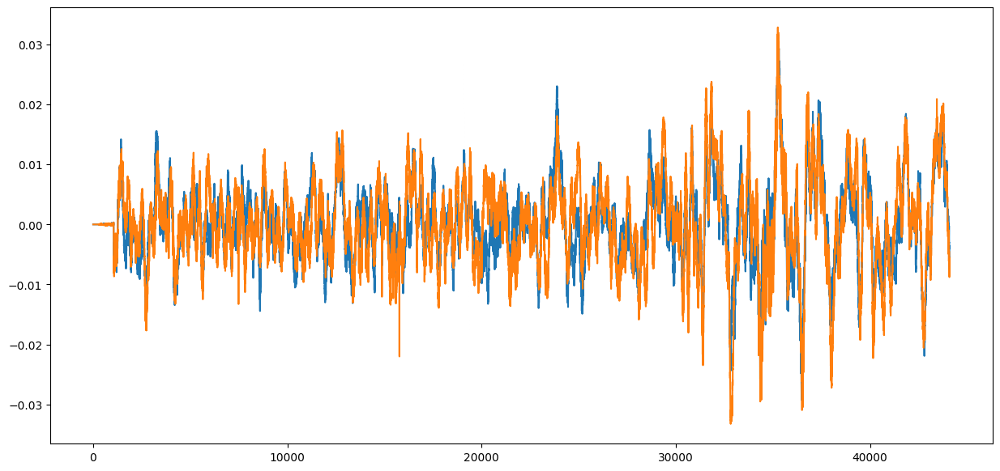

In [ ]:
fig, ax = plt.subplots(figsize = (15, 7))
ax.plot(soundArr[:soundSampleRate])
plt.show()

We get 2 (Left and Right) nearly "flat" (or equally wavy) lines. This means that there is very little noise at this part of the recording. What variation exists is due to compression or interference and represents the slight hiss you sometimes hear in low quality recordings.

Let's expand our scope and look at the first 10 seconds:

In [ ]:
soundArr.shape

(65705472, 2)

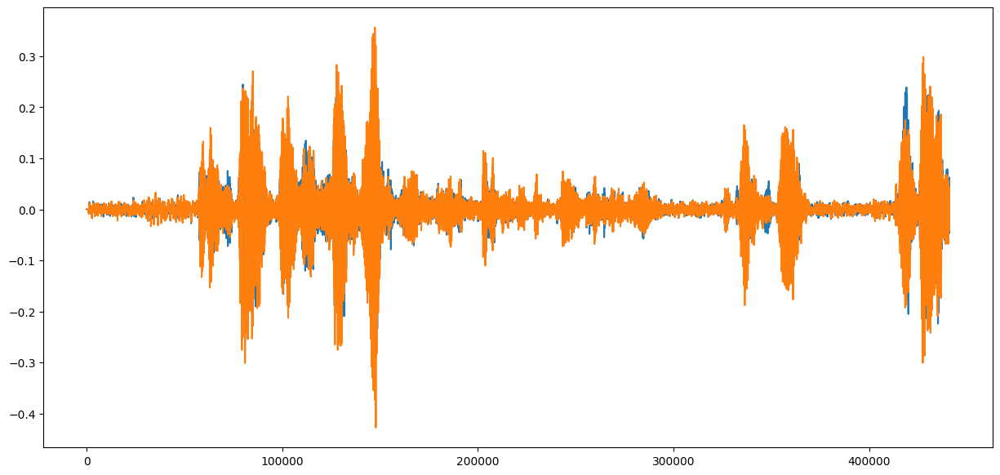

In [ ]:
fig, ax = plt.subplots(figsize = (15, 7))
ax.plot(soundArr[:soundSampleRate * 10])
plt.show()

Now we can see definite spikes, where each represents a word or discrete sound.

To see what the different parts correspond to, we can use a transcript. Because we got this file from the [Santa Barbara Corpus of Spoken American English
](http://www.linguistics.ucsb.edu/research/santa-barbara-corpus#Contents), we just need to load the metadata, which includes a transcription.

In [ ]:
def loadTranscript(targetFile):
    #Regex because the transcripts aren't consistent enough to use csv
    regex = re.compile(r"(\d+\.\d+)\s(\d+\.\d+)\s(.+:)?\s+(.*)")
    dfDict = {
        'time_start' : [],
        'time_end' : [],
        'speaker' : [],
        'text' : [],
    }
    with open(targetFile, encoding='latin-1') as f:
        for line in f:
            r = re.match(regex, line)
            dfDict['time_start'].append(float(r.group(1)))
            dfDict['time_end'].append(float(r.group(2)))
            if r.group(3) is None:
                dfDict['speaker'].append(dfDict['speaker'][-1])
            else:
                dfDict['speaker'].append(r.group(3))
            dfDict['text'].append(r.group(4))
    return pandas.DataFrame(dfDict)

transcriptDF = loadTranscript(transcriptPath)
transcriptDF[:10]

,time_start,time_end,speaker,text
0,0.000,2.572,ALAN:,"... (H) I got a story to tell you,"
1,2.572,3.820,ALAN:,"it's a shaggy dog story,"
2,3.820,6.645,ALAN:,but as long as were talking about that record...
3,6.645,8.378,ALAN:,"(H)= Ill tell you the story,"
4,8.378,10.178,ALAN:,"(H)= oh gosh,"
5,10.178,10.678,ALAN:,"uh (Hx),"
6,10.678,12.335,ALAN:,"Rae and I and Sue and Buddy,"
7,12.335,14.727,ALAN:,"... took a trip,"
8,14.727,17.012,ALAN:,"... to Mexico City,"
9,17.012,18.761,JON:,... (SNIFF)


Now let's look at a few sub-sections. First, to make things easier, we will convert the seconds markers to sample indices:

In [ ]:
#Need to be ints for indexing, luckily being off by a couple indices doesn't matter
transcriptDF['index_start'] = (transcriptDF['time_start'] * soundSampleRate).astype('int')
transcriptDF['index_end'] = (transcriptDF['time_end'] * soundSampleRate).astype('int')

Lets see what `'Rae and I and Sue and Buddy,'` looks like, which is the seventh row:

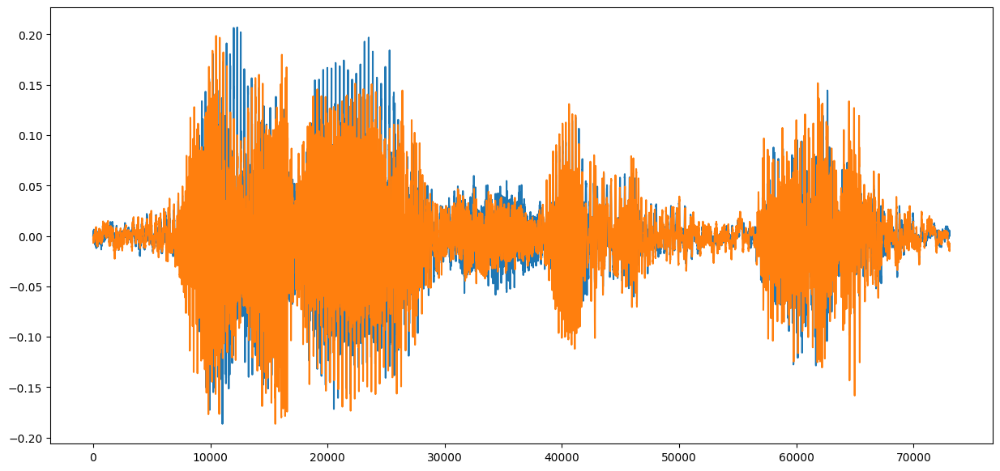

In [ ]:
fig, ax = plt.subplots(figsize = (15, 7))
subSample1 = soundArr[transcriptDF['index_start'][6]: transcriptDF['index_end'][6]]
ax.plot(subSample1)
plt.show()

And now let's hear what that sounds like:

In [ ]:
soundfile.write('/content/drive/MyDrive/macss6000/week9/audio_samples/sample1.wav', subSample1, soundSampleRate)
IPython.display.Audio('/content/drive/MyDrive/macss6000/week9/audio_samples/sample1.wav')

In order to see sounds in the frequency space, we can take the Fourier transform. This is a reversible mathematical transform named after the French mathematician Joseph Fourier (1768-1830) <img src="data/Fourier.jpg">. The transform decomposes a time series into a sum of finite series of sine or cosine functions.

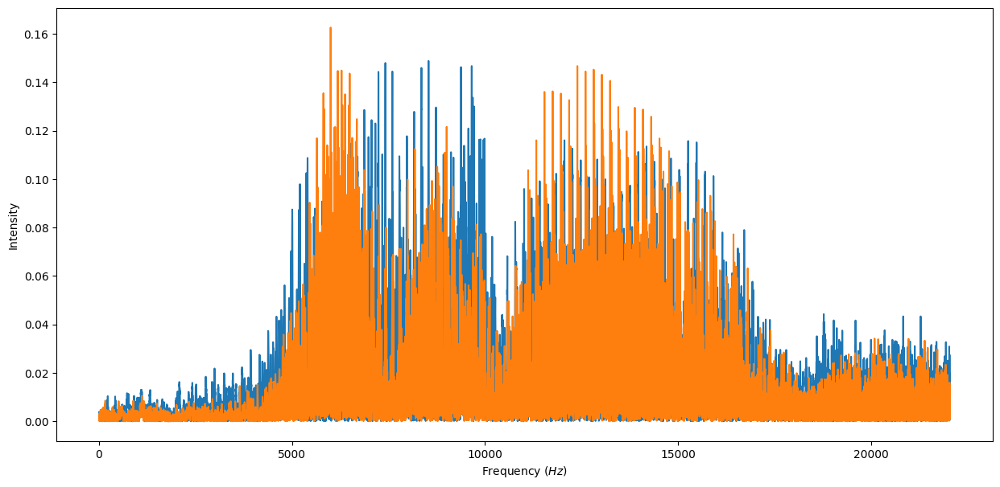

In [ ]:
sample1FFT = scipy.fftpack.ifft(subSample1)
N = len(sample1FFT)
freq = scipy.fftpack.fftfreq(N, d = 1 / soundSampleRate)
fig, ax = plt.subplots(figsize = (15, 7))
ax.set_xlabel('Frequency ($Hz$)')
ax.set_ylabel('Intensity')
ax.plot(freq[:N//2], abs(sample1FFT)[:N//2]) #Only want positive frequencies
plt.show()

This shows that there are two frequencies to the 'Rae and I and Sue and Buddy' snippet: a higher pitched 'Rae and I...Sue...Buddy' (~14000 *Hz*) and the final two 'and's (one at ~6000 *Hz* and the second at ~8000 *Hz*).

What does a sniff look like?

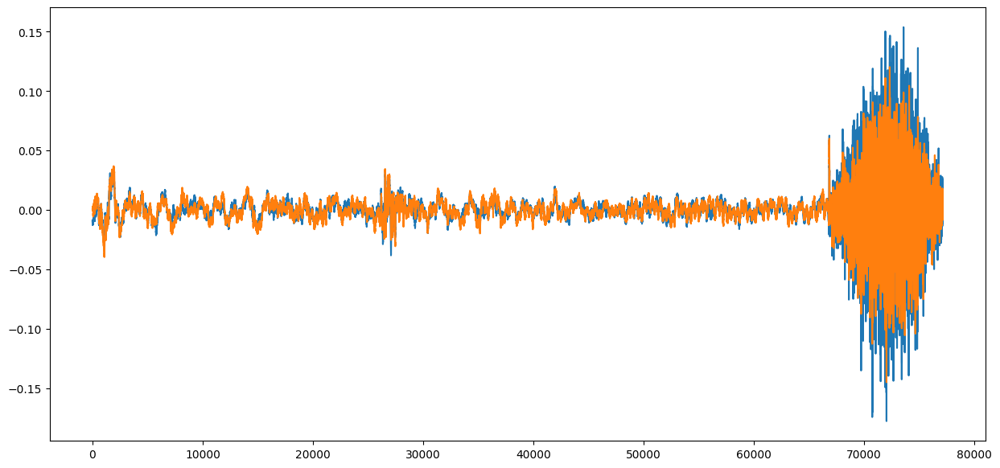

In [ ]:
fig, ax = plt.subplots(figsize = (15, 7))
subSample2 = soundArr[transcriptDF['index_start'][9]: transcriptDF['index_end'][9]]
ax.plot(subSample2)
plt.show()

Very different from speech. And now let's see what that sounds like:

In [ ]:
soundfile.write('/content/drive/MyDrive/macss6000/week9/audio_samples/sample2.wav', subSample2, soundSampleRate)
IPython.display.Audio('/content/drive/MyDrive/macss6000/week9/audio_samples/sample2.wav')

and in frequency space:

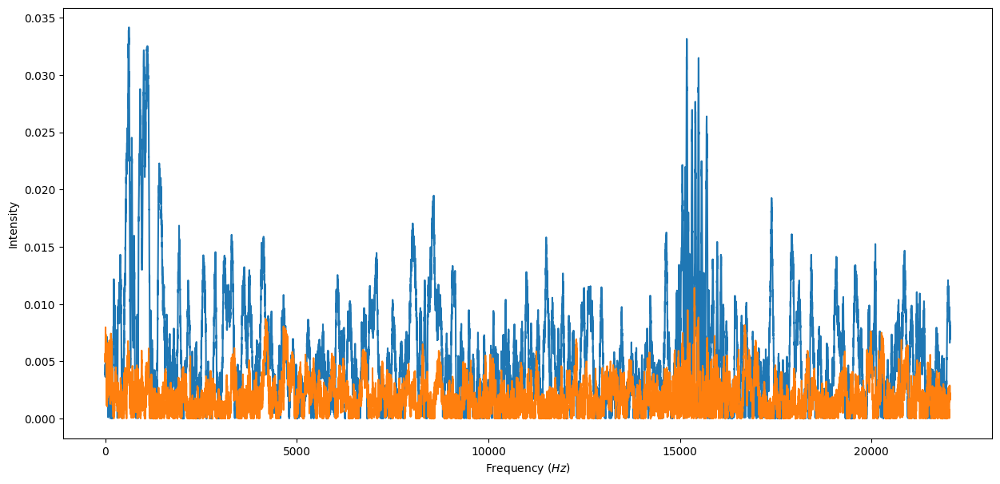

In [ ]:
sample2FFT = scipy.fftpack.ifft(subSample2)
N = len(sample2FFT)
freq = scipy.fftpack.fftfreq(N, d = 1 / soundSampleRate)
fig, ax = plt.subplots(figsize = (15, 7))
ax.plot(freq[:N//2], abs(sample2FFT)[:N//2]) #Only want positive frequencies
ax.set_xlabel('Frequency ($Hz$)')
ax.set_ylabel('Intensity')
plt.show()

Notice how there is not a dominant frequency for the sniff as there was for the noun phrase earlier. This means that the sniff activated noise all across the frequency spectrum.

We can also investigate dominant frequencies for the entire record:

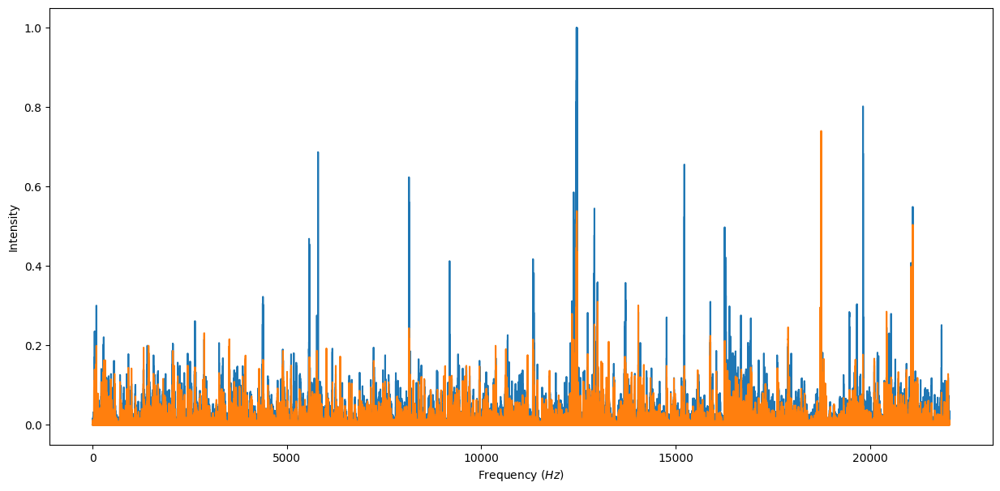

In [ ]:
#This can take a minute
fig, ax = plt.subplots(figsize = (15, 7))
fullFFT = scipy.fftpack.ifft(soundArr)
N = len(fullFFT)
freq = scipy.fftpack.fftfreq(N, d = 1 / soundSampleRate)
ax.plot(freq[:N//2], abs(fullFFT)[:N//2]) #Only want positive frequencies
ax.set_xlabel('Frequency ($Hz$)')
ax.set_ylabel('Intensity')
plt.show()

In [ ]:
freq[len(freq) // 2 -10: len(freq) // 2 + 5]

array([ 22049.99328823,  22049.99395941,  22049.99463058,  22049.99530176,
        22049.99597294,  22049.99664412,  22049.99731529,  22049.99798647,
        22049.99865765,  22049.99932882, -22050.        , -22049.99932882,
       -22049.99865765, -22049.99798647, -22049.99731529])

Here we capture each person's frequencies across their entire collection of statements:

In [ ]:
def maxfreq(sample, topN = 10):
    sampleFFT = scipy.fftpack.ifft(sample)
    N = len(sample)
    freqs = scipy.fftpack.fftfreq(N, d = 1 / soundSampleRate)
    tops =  np.argpartition(abs(sampleFFT[:, 0]), -topN)[-topN:]

    return np.mean(tops)

freqs = []
for i, row in transcriptDF.iterrows():
    freqs.append(maxfreq(soundArr[row['index_start']: row['index_end']]))

transcriptDF['frequency FFT'] = freqs

Alan's speech exhibits the following frequencies:

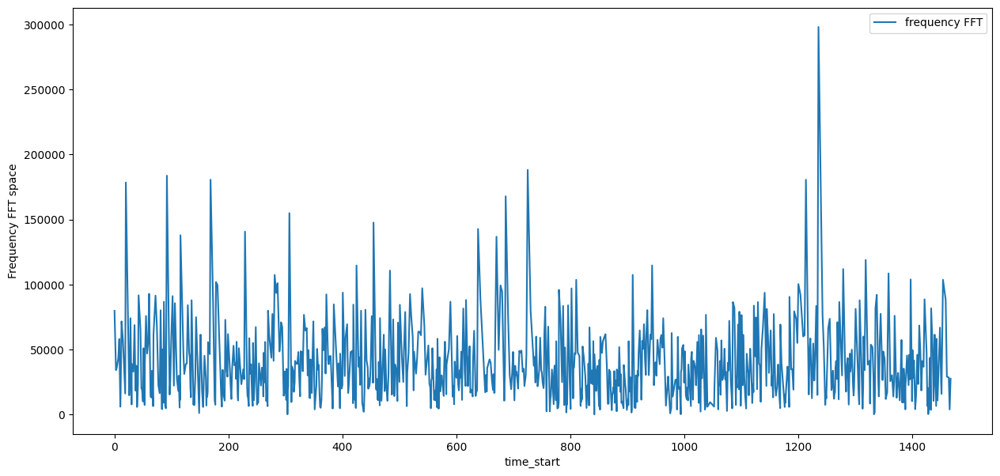

In [ ]:
fig, ax = plt.subplots(figsize = (15, 7))
transcriptDF[transcriptDF['speaker'] == 'ALAN:'].plot( 'time_start', 'frequency FFT', ax = ax)
ax.set_ylabel("Frequency FFT space")
plt.show()

...while Jon's voice is **much** lower:

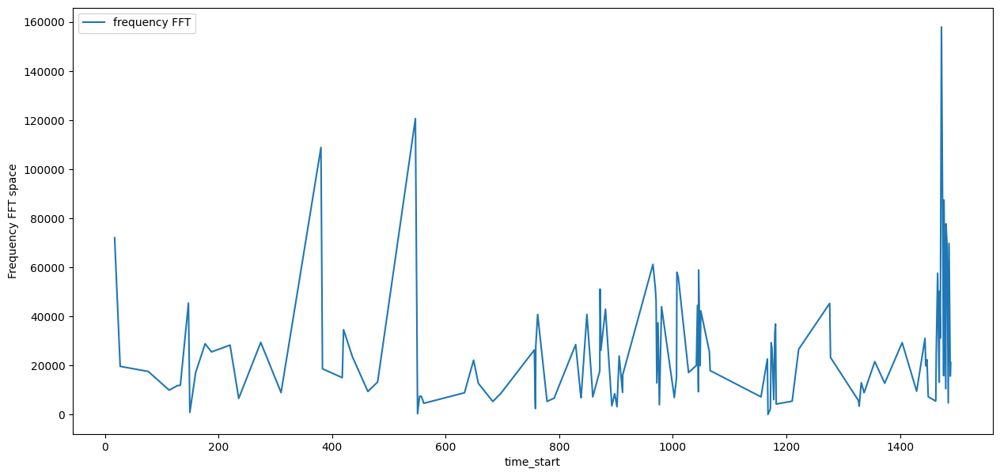

In [ ]:
fig, ax = plt.subplots(figsize = (15, 7))
transcriptDF[transcriptDF['speaker'] == 'JON:'].plot( 'time_start', 'frequency FFT', ax = ax)
ax.set_ylabel("Frequency FFT space")
plt.show()

Or we can look at them togther

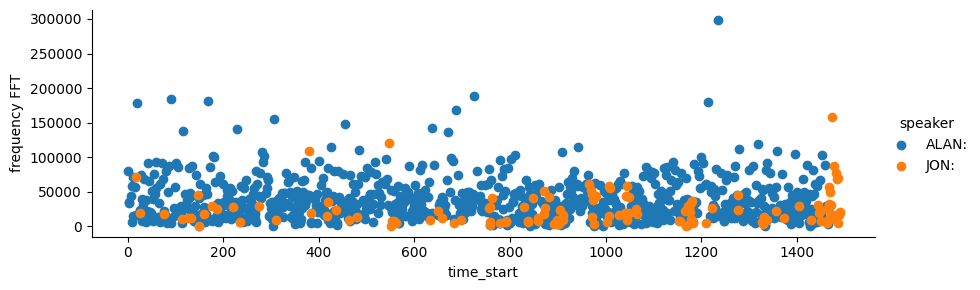

In [ ]:
fg = seaborn.FacetGrid(data=transcriptDF, hue='speaker', aspect = 3)
fg.map(plt.scatter, 'time_start', 'frequency FFT').add_legend()

## Speech-to-Text

We can also do speech recognition on audio, but this requires a complex machine learning system. Luckily there are many online services to do this. We have a function that uses Google's API. There are two API's: one is free but limited; the other is commercial and you can provide the function `speechRec` with a file containing the API keys, using `jsonFile=` if you wish. For more about this look [here](https://stackoverflow.com/questions/38703853/how-to-use-google-speech-recognition-api-in-python) or the `speech_recognition` [docs](https://github.com/Uberi/speech_recognition).

In [ ]:
#Using another library so we need to use files again
def speechRec(targetFile, language = "en-US", raw = False, jsonFile = ''):
    r = speech_recognition.Recognizer()
    if not os.path.isfile(jsonFile):
        jsonString = None
    else:
        with open(jsonFile) as f:
            jsonString = f.read()
    with speech_recognition.AudioFile(targetFile) as source:
        audio = r.record(source)
    try:
        if jsonString is None:
            print("Sending data to Google Speech Recognition")
            dat =  r.recognize_google(audio)
        else:
            print("Sending data to Google Cloud Speech")
            dat =  r.recognize_google_cloud(audio, credentials_json=jsonString)
    except speech_recognition.UnknownValueError:
        print("Google could not understand audio")
    except speech_recognition.RequestError as e:
        print("Could not request results from Google service; {0}".format(e))
    else:
        print("Success")
        return dat

The example above is of too low quality so we will be using another file `data/audio_samples/english.wav`

In [ ]:
import wave

# open up a wave
wf = wave.open('/content/drive/MyDrive/macss6000/week9/audio_samples/english.wav', 'rb')
swidth = wf.getsampwidth()
RATE = wf.getframerate()

In [ ]:
IPython.display.Audio('/content/drive/MyDrive/macss6000/week9/audio_samples/english.wav', rate=RATE)

In [ ]:
speechRec('/content/drive/MyDrive/macss6000/week9/audio_samples/english.wav')

Sending data to Google Speech Recognition
Success


"but what if somebody decides to break it be careful that you keep adequate coverage but look for places to save money maybe it's taking longer to get things squared away then the bankers expected hiring the wife for once company may win her tax aided retirement income the Boost is helpful but inadequate new self-deceiving Rags or hersley tossed on the two naked bones what a discussion Canyon Sue when the title of this type of song is in question there's no dying or waxing or gassing needed paperweight maybe personalized on Place work on a flat surface and smooth out the simplest kind of system uses a single self-contained unit the old shop added still holds a good mechanic is usually a bad boss both figures some make beautiful chairs cabinets doll houses at"

## <font color="red">*Exercise 1*</font>

<font color="red">Construct cells immediately below this that read in 10 audio files (e.g., produced on your smartphone recorder?) from at least two different speakers, which include sentences of different types (e.g., question, statement, exclamation). At least two of these should include recordings of the two speakers talking to each other (e.g., a simple question/answer). Contrast the frequency distributions of the words spoken within speaker. What speaker's voice has a higher and which has lower frequency? What words are spoken at the highest and lowest frequencies? What parts-of-speech tend to be high or low? How do different types of sentences vary in their frequency differently? When people are speaking to each other, how do their frequencies change? Whose changes more?
    
OR

<font color="red">Construct cells immediately below this that use the 10 audio files from at least two different speakers read in previously, attempt to automatically extract the words from Google, and calculate the word-error rate, as descibed in Chapter 9 from *Jurafsky & Martin*, page 334. How well does it do? Under what circumstances does it perform poorly?

https://www.youtube.com/watch?v=aBglxa6K8gc

President Trump's Full, Unedited Interview With Meet The Press | NBC News

In [ ]:
import soundfile as sf
import os

In [ ]:
def load_wav_files(directory, max_files=10):
    # List all files in the specified directory
    all_files = os.listdir(directory)
    # Filter out files with the .wav extension
    wav_files = [file for file in all_files if file.endswith('.wav')]
    # Load the first `max_files` .wav files
    audio_data = []
    for wav_file in wav_files[:max_files]:
        file_path = os.path.join(directory, wav_file)
        data, samplerate = sf.read(file_path)
        audio_data.append((data, samplerate))
    return audio_data

In [ ]:
directory = '/content/drive/MyDrive/macss6000/week9/Trump'

In [ ]:
# Load the .wav files
wav_data = load_wav_files(directory)

In [ ]:
# Print basic information about the loaded files
for i, (data, samplerate) in enumerate(wav_data):
    print(f"File {i+1}: Samplerate = {samplerate}, Data shape = {data.shape}")

File 1: Samplerate = 48000, Data shape = (5039891, 2)
File 2: Samplerate = 48000, Data shape = (5039891, 2)
File 3: Samplerate = 48000, Data shape = (5039891, 2)
File 4: Samplerate = 48000, Data shape = (5039891, 2)
File 5: Samplerate = 48000, Data shape = (5039891, 2)
File 6: Samplerate = 48000, Data shape = (5039891, 2)
File 7: Samplerate = 48000, Data shape = (5039891, 2)
File 8: Samplerate = 48000, Data shape = (5039891, 2)
File 9: Samplerate = 48000, Data shape = (5039891, 2)
File 10: Samplerate = 48000, Data shape = (55438805, 2)


In [ ]:
def load_and_print_durations(directory, max_files=10):
    # List all files in the specified directory
    all_files = os.listdir(directory)
    # Filter out files with the .wav extension
    wav_files = [file for file in all_files if file.endswith('.wav')]
    # Process the first `max_files` .wav files
    for wav_file in wav_files[:max_files]:
        file_path = os.path.join(directory, wav_file)
        data, samplerate = sf.read(file_path)
        # Calculate duration
        numS = data.shape[0] // samplerate
        print(f"File: {wav_file}")
        print(f"The sample is {numS} seconds long")
        print(f"Or {numS / 60:.2f} minutes\n")

# Load the .wav files and print their durations
load_and_print_durations(directory)

File: split_5.wav
The sample is 104 seconds long
Or 1.73 minutes

File: split_9.wav
The sample is 104 seconds long
Or 1.73 minutes

File: split_7.wav
The sample is 104 seconds long
Or 1.73 minutes

File: split_4.wav
The sample is 104 seconds long
Or 1.73 minutes

File: split_2.wav
The sample is 104 seconds long
Or 1.73 minutes

File: split_1.wav
The sample is 104 seconds long
Or 1.73 minutes

File: split_8.wav
The sample is 104 seconds long
Or 1.73 minutes

File: split_6.wav
The sample is 104 seconds long
Or 1.73 minutes

File: split_3.wav
The sample is 104 seconds long
Or 1.73 minutes

File: split_10.wav
The sample is 1154 seconds long
Or 19.23 minutes



In [ ]:
import matplotlib.pyplot as plt

In [ ]:
def load_and_plot_wav_files(directory, max_files=10):
    # List all files in the specified directory
    all_files = os.listdir(directory)
    # Filter out files with the .wav extension
    wav_files = [file for file in all_files if file.endswith('.wav')]
    # Initialize the figure for plotting
    fig, axs = plt.subplots(max_files, 1, figsize=(15, 7 * max_files))

    # Process the first `max_files` .wav files
    for i, wav_file in enumerate(wav_files[:max_files]):
        file_path = os.path.join(directory, wav_file)
        data, samplerate = sf.read(file_path)
        # Plot the first second of the audio file
        axs[i].plot(data[:samplerate])
        axs[i].set_title(wav_file)

    plt.tight_layout()
    plt.show()

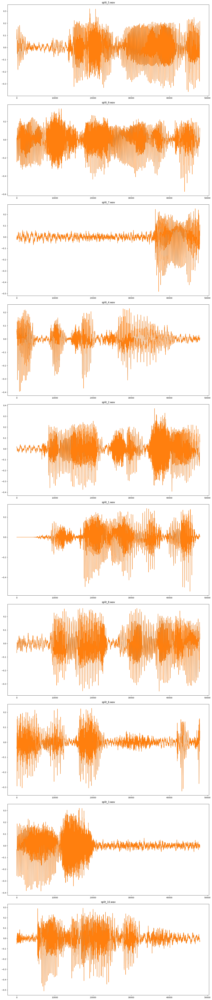

In [ ]:
# Load the .wav files and plot their first second of audio data
load_and_plot_wav_files(directory)

In [ ]:
def load_and_plot_wav_files_ten(directory, max_files=10):
    # List all files in the specified directory
    all_files = os.listdir(directory)
    # Filter out files with the .wav extension
    wav_files = [file for file in all_files if file.endswith('.wav')]
    # Initialize the figure for plotting
    fig, axs = plt.subplots(max_files, 1, figsize=(15, 7 * max_files))

    # Process the first `max_files` .wav files
    for i, wav_file in enumerate(wav_files[:max_files]):
        file_path = os.path.join(directory, wav_file)
        data, samplerate = sf.read(file_path)
        # Plot the first second of the audio file
        axs[i].plot(data[:samplerate* 10])
        axs[i].set_title(wav_file)

    plt.tight_layout()
    plt.show()

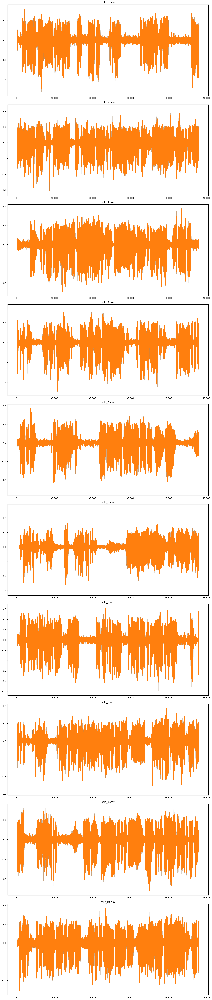

In [ ]:
load_and_plot_wav_files_ten(directory)

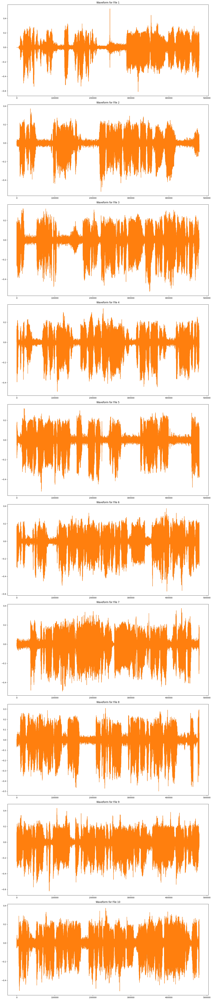

In [ ]:
# Placeholder for demo purposes. Replace with actual file paths.
wav_files = [f'/content/drive/MyDrive/macss6000/week9/Trump/split_{i}.wav' for i in range(1, 11)]

# Set up the figure for plotting
fig, axes = plt.subplots(10, 1, figsize=(15, 7*10))  # 10 subplots

for i, file_path in enumerate(wav_files):
    # Read the WAV file
    soundArr, soundSampleRate = sf.read(file_path)
    # Calculate the range to plot (first 10 seconds)
    plot_range = soundSampleRate * 10
    # Make sure not to exceed the length of the sound array
    plot_range = plot_range if plot_range < len(soundArr) else len(soundArr)
    # Plot the waveform for the first 10 seconds
    axes[i].plot(soundArr[:plot_range])
    axes[i].set_title(f'Waveform for File {i+1}')

plt.tight_layout()
plt.show()

In [ ]:
all_files = os.listdir(directory)
# Filter out files with the .wav extension
wav_files = [file for file in all_files if file.endswith('.wav')]
wav_files

['split_5.wav',
 'split_9.wav',
 'split_7.wav',
 'split_4.wav',
 'split_2.wav',
 'split_1.wav',
 'split_8.wav',
 'split_6.wav',
 'split_3.wav',
 'split_10.wav']

In [ ]:
import wave

# open up a wave
wf1 = wave.open('/content/drive/MyDrive/macss6000/week9/Trump/split_1.wav', 'rb')
swidth1 = wf1.getsampwidth()
RATE1 = wf1.getframerate()

In [ ]:
IPython.display.Audio('/content/drive/MyDrive/macss6000/week9/Trump/split_1.wav', rate=RATE1)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
speechRec('/content/drive/MyDrive/macss6000/week9/Trump/split_1.wav')

Sending data to Google Speech Recognition


In [ ]:
speechRec('/content/drive/MyDrive/macss6000/week9/Trump/split_1.wav')

Sending data to Google Speech Recognition
Success


'well you had a situation that was very bad cuz the night before they shut down and unmanned drone and the unmanned is a very big factor the fact that there was not a person on it and the US person or anybody and that had an impact on me I said well you know we got a little problem and I think they did it on purpose because they understand that they will be very hard if that were playing with a person in it and I think they know that there was nobody there so we had a very pretty pretty sure something better'

In [ ]:
speechrec1 = speechRec('/content/drive/MyDrive/macss6000/week9/Trump/split_1.wav')

Sending /content/drive/MyDrive/macss6000/week9/Trump/split_1.wav data to Google Speech Recognition
Success: /content/drive/MyDrive/macss6000/week9/Trump/split_1.wav


In [ ]:
speechrec1 =

'well you had a situation that was very bad cuz the night before they shut down and unmanned drone and the unmanned is a very big factor the fact that there was not a person on it and the US person or anybody and that had an impact on me I said well you know we got a little problem and I think they did it on purpose because they understand that they will be very hard if that were playing with a person in it and I think they know that there was nobody there so we had a very pretty pretty sure something better'

In [ ]:
# open up a wave
wf2 = wave.open('/content/drive/MyDrive/macss6000/week9/Trump/split_2.wav', 'rb')
swidth2 = wf2.getsampwidth()
RATE2 = wf2.getframerate()

In [ ]:
# open up a wave
wf3 = wave.open('/content/drive/MyDrive/macss6000/week9/Trump/split_3.wav', 'rb')
swidth3 = wf3.getsampwidth()
RATE3 = wf3.getframerate()

In [ ]:
# open up a wave
wf4 = wave.open('/content/drive/MyDrive/macss6000/week9/Trump/split_4.wav', 'rb')
swidth4 = wf4.getsampwidth()
RATE4 = wf4.getframerate()

In [ ]:
# open up a wave
wf5 = wave.open('/content/drive/MyDrive/macss6000/week9/Trump/split_5.wav', 'rb')
swidth5 = wf5.getsampwidth()
RATE5 = wf5.getframerate()

In [ ]:
# open up a wave
wf6 = wave.open('/content/drive/MyDrive/macss6000/week9/Trump/split_6.wav', 'rb')
swidth6 = wf6.getsampwidth()
RATE6 = wf6.getframerate()

In [ ]:
# open up a wave
wf7 = wave.open('/content/drive/MyDrive/macss6000/week9/Trump/split_7.wav', 'rb')
swidth7 = wf7.getsampwidth()
RATE7 = wf7.getframerate()

In [ ]:
# open up a wave
wf8 = wave.open('/content/drive/MyDrive/macss6000/week9/Trump/split_8.wav', 'rb')
swidth8 = wf8.getsampwidth()
RATE8 = wf8.getframerate()

In [ ]:
# open up a wave
wf9 = wave.open('/content/drive/MyDrive/macss6000/week9/Trump/split_9.wav', 'rb')
swidth9 = wf9.getsampwidth()
RATE9 = wf9.getframerate()

In [ ]:
# open up a wave
wf10 = wave.open('/content/drive/MyDrive/macss6000/week9/Trump/split_10.wav', 'rb')
swidth10 = wf10.getsampwidth()
RATE10 = wf10.getframerate()

In [ ]:
speechrec2 = speechRec('/content/drive/MyDrive/macss6000/week9/Trump/split_2.wav')
speechrec3 = speechRec('/content/drive/MyDrive/macss6000/week9/Trump/split_3.wav')
speechrec4 = speechRec('/content/drive/MyDrive/macss6000/week9/Trump/split_4.wav')
speechrec5 = speechRec('/content/drive/MyDrive/macss6000/week9/Trump/split_5.wav')
speechrec6 = speechRec('/content/drive/MyDrive/macss6000/week9/Trump/split_6.wav')
speechrec7 = speechRec('/content/drive/MyDrive/macss6000/week9/Trump/split_7.wav')
speechrec8 = speechRec('/content/drive/MyDrive/macss6000/week9/Trump/split_8.wav')

Sending /content/drive/MyDrive/macss6000/week9/Trump/split_2.wav data to Google Speech Recognition
Success: /content/drive/MyDrive/macss6000/week9/Trump/split_2.wav
Sending /content/drive/MyDrive/macss6000/week9/Trump/split_3.wav data to Google Speech Recognition
Success: /content/drive/MyDrive/macss6000/week9/Trump/split_3.wav
Sending /content/drive/MyDrive/macss6000/week9/Trump/split_4.wav data to Google Speech Recognition
Success: /content/drive/MyDrive/macss6000/week9/Trump/split_4.wav
Sending /content/drive/MyDrive/macss6000/week9/Trump/split_5.wav data to Google Speech Recognition
Success: /content/drive/MyDrive/macss6000/week9/Trump/split_5.wav
Sending /content/drive/MyDrive/macss6000/week9/Trump/split_6.wav data to Google Speech Recognition
Success: /content/drive/MyDrive/macss6000/week9/Trump/split_6.wav
Sending /content/drive/MyDrive/macss6000/week9/Trump/split_7.wav data to Google Speech Recognition
Success: /content/drive/MyDrive/macss6000/week9/Trump/split_7.wav
Sending /c

In [ ]:
speechrec9 = speechRec('/content/drive/MyDrive/macss6000/week9/Trump/split_9.wav')
speechrec10 = speechRec('/content/drive/MyDrive/macss6000/week9/Trump/split_10.wav')

Sending /content/drive/MyDrive/macss6000/week9/Trump/split_9.wav data to Google Speech Recognition
Google could not understand audio
Sending /content/drive/MyDrive/macss6000/week9/Trump/split_10.wav data to Google Speech Recognition
Could not request results from Google service; recognition connection failed: [Errno 32] Broken pipe


In [ ]:
speechrec2

"came back said sure approximately 150 and I thought about it for a second and I said you know what they shut down an unmanned drone playing whatever you want to call it and here we are sitting with 150 dead people that would have taken place probably within a half an hour after I said go ahead and I didn't like it I didn't think it was I didn't think it was proportionate now that doesn't mean what should the response I think the response should be well as you know we've done very much is always going to be very strong I don't have a lot of people don't work out that way we're doing great in North Korea we're doing great in a lot of different places 100% remember I was going to leave it 100% volume"

In [ ]:
speechrec3

"Play House it'll be done no I don't think so and I think it was very important that they to them don't forget their economy you don't think they intended to get you to respond military their economy is shattered shattered so what's the message they're trying to send you with this song gets 91% of its own from the streets we don't even need the streets we have we are now because of since I came in with the number one energy producer in the world OK Google"

In [ ]:
speechrec4

"not particularly so they came to prime minister Abbey he then called me I said send the following message you can't have nuclear weapons and other than that we can sit down and make a deal but you cannot have no other conditions other than that can I have nuclear weapons and they would have had them with President Obama they gave him $150 a lot of people don't know that that was an agreement that he couldn't get through Congress he was not authorized give him some authorization the European Union"

In [ ]:
speechrec5

"does it really they have really taken advantage of us for a long time just to finish with great relationships with Europe I don't mind Europe getting in the middle Europe wants to make a deal to Europe would love to see a deal being made everybody involved in the same deal with the Russian they cannot have a nuclear weapons"

In [ ]:
speechrec6

"for years and years and before it ever happened I was against going into Iraq and some people said oh I don't know I was totally against and I was a private citizen it never made sense to me I was against going into the Middle East Chuck we spent seven trillion dollars in the Middle East right now this is a proxy war Iran and Saudi Arabia and that's enough has nothing to do with oil for 400 billion dollars worth of things for us now"

In [ ]:
speechrec7

"and that but Economic Development never mind the humanitarian disaster goes into him and they start firing rockets at Saudi Arabia Saudi Arabia has to protect themselves Jack but it's it's a million jobs and probably more they buy massive amounts of 150 billion dollars worth of military equipment that way we use we use them military equipment and unlike other countries that don't have money and we have to subsidize everything so sorry baby is a big buyer of America product that means something to me it's a big producer of jobs available tomorrow to 450 billion over here period"

In [ ]:
speechrec8

"do business with the Russians are with the Chinese they will buy we make the best equipment in the world but they will buy great equipment from Russia and from China Chuck take the money check about a President Who on his watch had a ranch shooting down a drone a Venezuelan dictator Thumb in his nose at you Obamacare still on the books and no results yet on the border the board game Mexico for 45 years right so for 45 years ago today by the end of next year and that's hard because the Democrats don't want to approve it we just beat them in a big laws in Washington DC we just beat them up"

In [ ]:
speechrec9

In [ ]:
speechrec10

# Deep Learning for Audio

Today, most state of the art methods involving audio uses deep learning methods to embed audio in a high dimensional space - similar to some of the methods we have seen before for text. While earlier methods for speech feature extraction and classification used audio features such as some of what we saw earlier in this notebook (frequencies), as well as power (via the [Mel-frequency cepstrum](https://en.wikipedia.org/wiki/Mel-frequency_cepstrum) coefficients), the success of word2vec quickly inspired [speech2vec](https://arxiv.org/pdf/1803.08976.pdf) method to use these features to construct semantically coherent vectors. This was a jump from the acoustic and phenome based vectors previously calculated. Further work has lead to state-of-the-art wav2vec2, which we will explore in this section. We will be revisiting the Transformers package we saw last week, this time using them to load pre-trained wav2vec2 models for both creating a vector representation to making a transcription. In the example below we use a sample from librispeech, which is also what this model was trained on.

In [ ]:
!pip install -q datasets

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 536.7/536.7 kB 5.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 7.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 10.9 MB/s eta 0:00:00


In [ ]:
from transformers import Wav2Vec2Tokenizer, Wav2Vec2Model
from datasets import load_dataset
import soundfile as sf

tokenizer = Wav2Vec2Tokenizer.from_pretrained("facebook/wav2vec2-base-960h")
model = Wav2Vec2Model.from_pretrained("facebook/wav2vec2-base-960h")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/163 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/291 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/85.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.60k [00:00<?, ?B/s]

The tokenizer class you load from this checkpoint is not the same type as the class this function is called from. It may result in unexpected tokenization. 
The tokenizer class you load from this checkpoint is 'Wav2Vec2CTCTokenizer'. 
The class this function is called from is 'Wav2Vec2Tokenizer'.


model.safetensors:   0%|          | 0.00/378M [00:00<?, ?B/s]

Some weights of Wav2Vec2Model were not initialized from the model checkpoint at facebook/wav2vec2-base-960h and are newly initialized: ['wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original0', 'wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original1', 'wav2vec2.masked_spec_embed']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
def map_to_array(batch):
    speech, _ = sf.read(batch["file"])
    batch["speech"] = speech
    return batch

In [ ]:
ds = load_dataset("patrickvonplaten/librispeech_asr_dummy", "clean", split="validation")

Generating validation split: 0 examples [00:00, ? examples/s]

In [ ]:
ds = ds.map(map_to_array)
input_values = tokenizer(ds["speech"][0], return_tensors="pt").input_values  # Batch size 1
hidden_states = model(input_values).last_hidden_state

Map:   0%|          | 0/73 [00:00<?, ? examples/s]

In [ ]:
hidden_states

tensor([[[-0.0032, -0.0086,  0.0228,  ..., -0.1943,  0.0403, -0.1071],
         [ 0.0021, -0.0078,  0.0205,  ..., -0.2157,  0.0311, -0.1106],
         [-0.0056, -0.0330,  0.0698,  ..., -0.2463, -0.0076, -0.1500],
         ...,
         [-0.0060, -0.0336,  0.0704,  ..., -0.2466, -0.0082, -0.1501],
         [-0.0013, -0.0162,  0.0132,  ..., -0.1883,  0.0449, -0.0850],
         [-0.0029, -0.0174,  0.0129,  ..., -0.1893,  0.0441, -0.0821]]],
       grad_fn=<NativeLayerNormBackward0>)

The hidden state of the model serves as the embedding for the file. Below is the cosine similarity function - how would you use it to measure between audio embeddings?

In [ ]:
import torch.nn as nn
import torch

In [ ]:
cos = nn.CosineSimilarity(dim=1, eps=1e-6)

In [ ]:
from transformers import Wav2Vec2ForCTC

In [ ]:
model = Wav2Vec2ForCTC.from_pretrained("facebook/wav2vec2-base-960h")

Some weights of the model checkpoint at facebook/wav2vec2-base-960h were not used when initializing Wav2Vec2ForCTC: ['wav2vec2.encoder.pos_conv_embed.conv.weight_g', 'wav2vec2.encoder.pos_conv_embed.conv.weight_v']
- This IS expected if you are initializing Wav2Vec2ForCTC from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing Wav2Vec2ForCTC from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of Wav2Vec2ForCTC were not initialized from the model checkpoint at facebook/wav2vec2-base-960h and are newly initialized: ['wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original0', 'wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original1', 'wav2vec2.masked_spec_embed']
You sho

In [ ]:
logits = model(input_values).logits

In [ ]:
predicted_ids = torch.argmax(logits, dim=-1)

In [ ]:
transcription = tokenizer.decode(predicted_ids[0])

In [ ]:
transcription

'MISTER QUILTER IS THE APOSTLE OF THE MIDDLE CLASSES AND WE ARE GLAD TO WELCOME HIS GOSPEL'

We see here how we can quite easily transcribe text straight off the model from Transformers!

## <font color="red">*Exercise 2*</font>

<font color="red"> We've seen two ways in which we can use the wav2vec2 model from Transformers - to generate a high dimensional embedding, and to transcribe an audio file into text. All of this is done using a Deep Neural model!

<font color="red"> In the following cells, use these methods to conduct analysis of the 10 audio files which you have - maybe add 2 songs to the mix as well. How do the embeddings cluster the audio files? Which files are most similar to each other? How does the model perform with respect to a file recorded by you versus a song, versus the sample dataset? How can you incorporate the wav2vec2 model and other multi-modal data into your projects?



# Image analysis

Now we will explore image files. First, we will read in a couple of images. Please change the working image and see how the resuts differ:

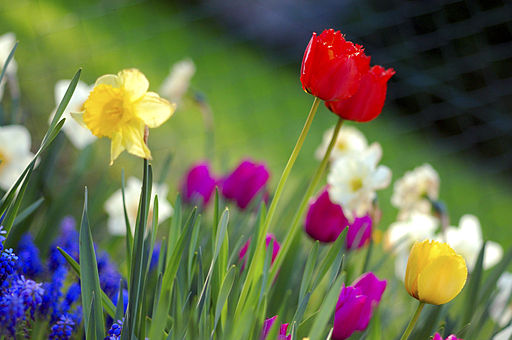

In [ ]:
image_wiki = PIL.Image.open('/content/drive/MyDrive/macss6000/week9/IMAGES/Wikimedia_Conference_2016_–_Group_photo.jpg')
image_wikiGray = PIL.ImageOps.invert(image_wiki.convert('L'))

image_AllSaints = PIL.Image.open('/content/drive/MyDrive/macss6000/week9/IMAGES/AllSaintsMargaretStreet-DAVID_ILIFF.jpg')
image_AllSaintsGray = PIL.ImageOps.invert(image_AllSaints.convert('L'))

image_Soyuz = PIL.Image.open('/content/drive/MyDrive/macss6000/week9/IMAGES/Soyuz.jpg')
image_SoyuzGray = PIL.ImageOps.invert(image_Soyuz.convert('L'))

image_Rock = PIL.Image.open('/content/drive/MyDrive/macss6000/week9/IMAGES/Bi-crystal.jpg')
image_RockGray = PIL.ImageOps.invert(image_Rock.convert('L'))

image_flowers = PIL.Image.open('/content/drive/MyDrive/macss6000/week9/IMAGES/flowers.jpg')
image_flowersGray = PIL.ImageOps.invert(image_flowers.convert('L'))

image = image_flowers

image

In [ ]:
imageArr = np.asarray(image)
imageArr.shape

(340, 512, 3)

The image we have loaded is a raster image, meaning it is a grid of pixels. Each pixel contains 1-4 numbers giving the amounts of color contained in it. In this case, we can see it has 3 values per pixel, these are RGB or Red, Green and Blue values. If we want to see just the red, we can look at just that array:

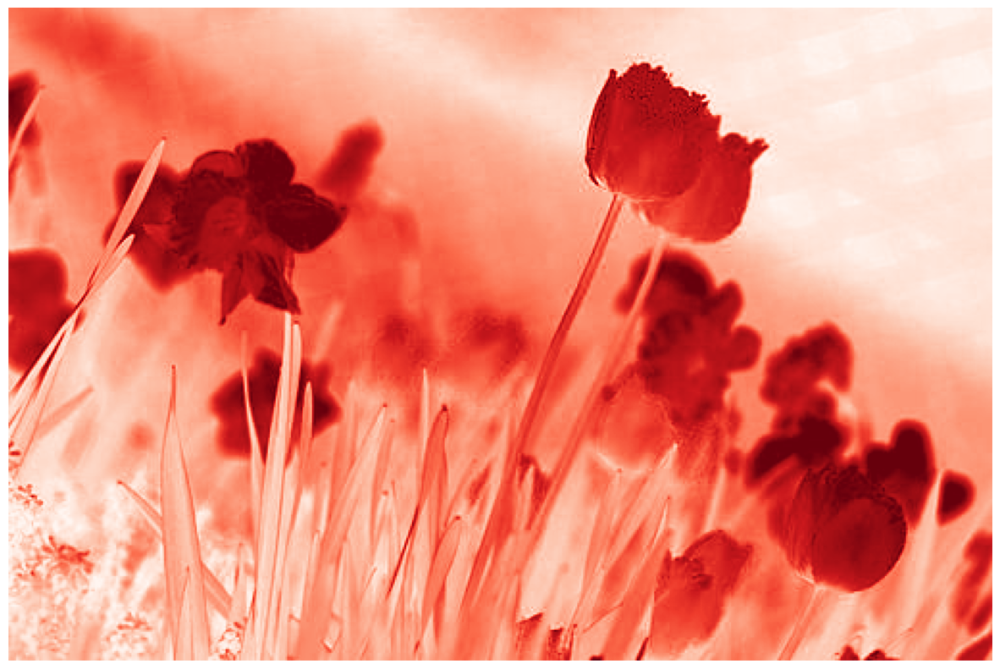

In [ ]:
imgRatio = imageArr.shape[0] / imageArr.shape[1]
fig, ax = plt.subplots(figsize = (15, 15))
ax.imshow(imageArr[:,:,0], cmap='Reds') #The order is R G B, so 0 is the Reds
ax.axis('off')
plt.show()

Or the others:

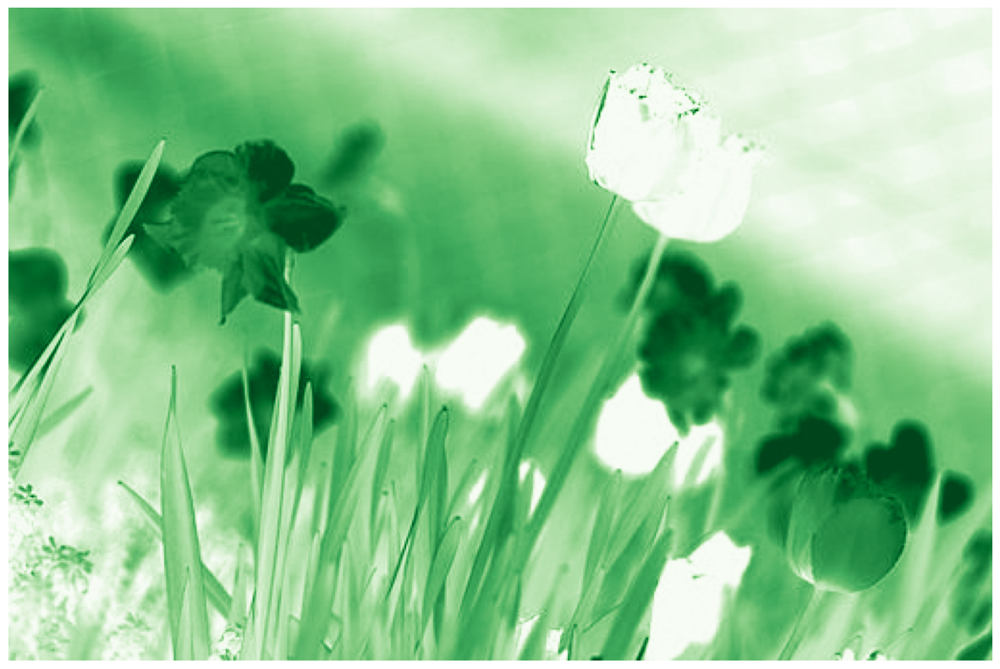

In [ ]:
imgRatio = imageArr.shape[0] / imageArr.shape[1]
fig, ax = plt.subplots(figsize = (15, 15))
ax.imshow(imageArr[:,:,1], cmap='Greens') #The order is R G B, so 2 is the Green
ax.axis('off')
plt.show()

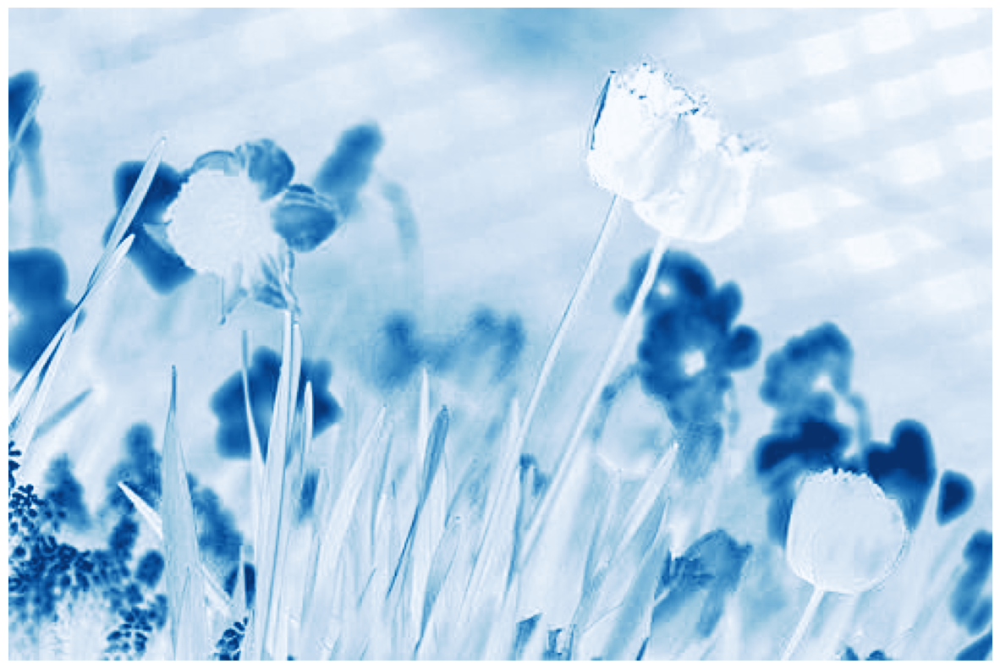

In [ ]:
imgRatio = imageArr.shape[0] / imageArr.shape[1]
fig, ax = plt.subplots(figsize = (15, 15))
ax.imshow(imageArr[:,:,2], cmap='Blues') #The order is R G B, so 2 is the Blue
ax.axis('off')
plt.show()

Or we can look at all four together:

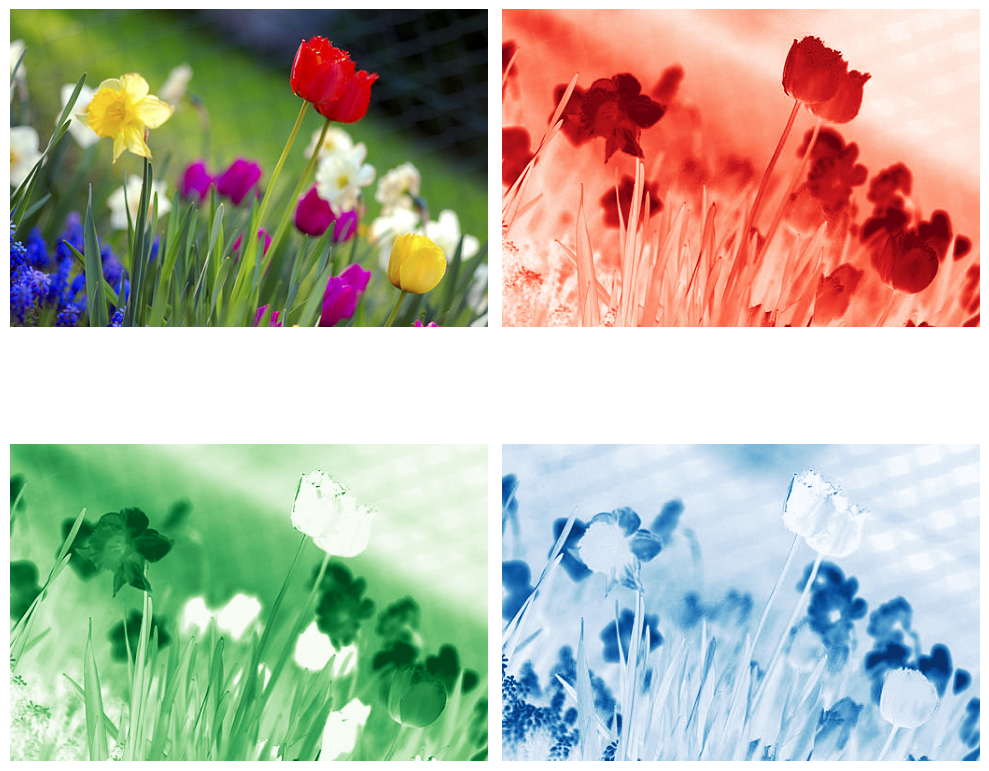

In [ ]:
fig, axes = plt.subplots(figsize = (10, 10), ncols=2, nrows=2)
axeIter = iter(axes.flatten())
colours = ["Reds", "Greens", "Blues"]
ax = next(axeIter)
ax.imshow(imageArr)
ax.axis('off')

for i in range(3):
    ax = next(axeIter)
    ax.imshow(imageArr[:,:,i], cmap=colours[i]) #The order is R G B, so 2 is the Blue
    ax.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
image_gray = PIL.ImageOps.invert(image.convert('L'))
image_grayArr = np.asarray(image_gray)
image_grayArr.shape

(340, 512)

A grayscale image is defined by its pixel intensities (and a color image can be defined by its red, green, blue pixel intensities).

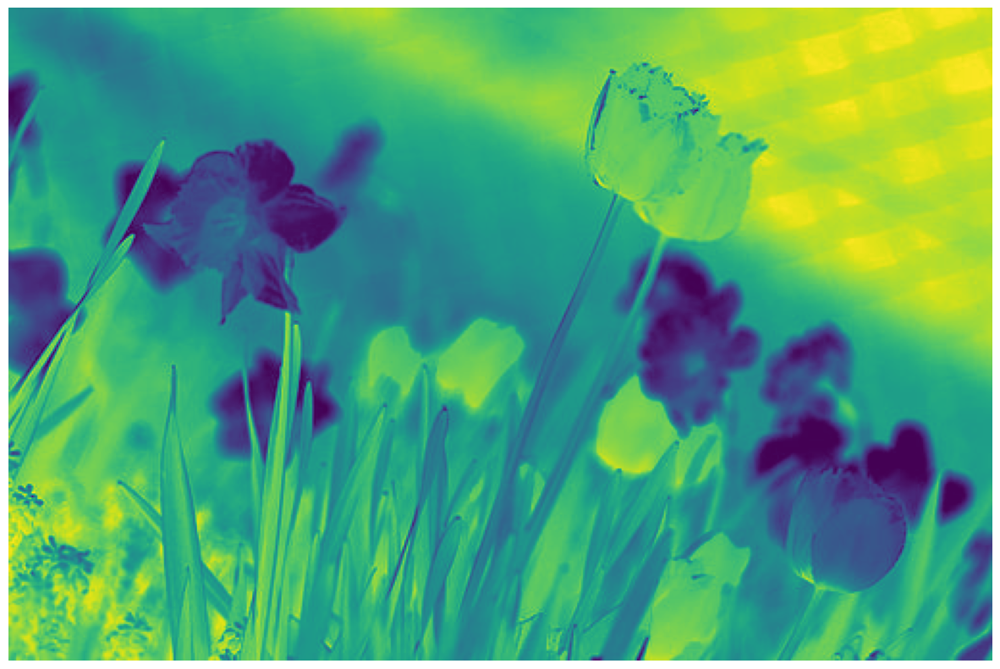

In [ ]:
imgRatio = imageArr.shape[0] / imageArr.shape[1]
fig, ax = plt.subplots(figsize = (15, 15))
ax.imshow(image_grayArr) #No third dimension
ax.axis('off')
plt.show()

# Deep Nets and Images

Modern image and video analysis is typically performed using deep learning implemented as layers of convolutional neural nets to classify scenes and to detect and label objects. We've already seen how deep learning is powerful for text (and audio, in this notebook). To learn more about deep learning and convolutional neural networks, spend some time with Andrew Ng's excellent [tutorial](http://ufldl.stanford.edu/tutorial/).

### Some Deep Learning Resources for Images
[This PyTorch tutorial](https://pytorch.org/tutorials/beginner/blitz/cifar10_tutorial.html) demonstrates how to train the classifiers. Image captioning is another application of such deep neural nets - [this GitHub repository](https://github.com/sgrvinod/a-PyTorch-Tutorial-to-Image-Captioning) walks us through how to do image captioning with pytorch. Object Detection and Scene Classification are other ways deep neural nets are used for images - [this PyTorch tutorial](https://pytorch.org/tutorials/intermediate/torchvision_tutorial.html) demonstrates Object Deteciton, and there are multiple ([1](https://github.com/buptchan/scene-classification), [2](https://github.com/ran337287/MRCNN-for-Scene-Classification), [3](https://github.com/zanilzanzan/FuseNet_PyTorch)]. Another popular open source image object detector is [UC Berkeley's caffe library](http://caffe.berkeleyvision.org) of trained and trainable neural nets written in C++. (Check out the [python api](https://github.com/BVLC/caffe/blob/master/python/caffe/pycaffe.py)). Scene classifiers can be built on top of caffe, such as MIT's [Places](http://places2.csail.mit.edu/demo.html).

# Creating Image Vectors with Deep Learning and More

While most Deep Learning methods for images are computationally heavy, there are still many ways to use the power of deep learning models (and other methods) to create useful representations of images for a variety of similarity tasks.
Most of the time intensive operations which CNNs perform happen during the training process. Model inference (which is when we use a model to either make a class prediction or embed an image in a high dimensional space), however, doesn't take so long, and we can make use of powerful pre-trained models to help us in our content analysis.

### Using Torch's pre-trained models

PyTorch is not only an elegant and powerful deep learning framework, but comes especially handy with its wide range of pre-trained models and datasets which allow for easy use. In this section, we will use AlexNet, a deep learning model famous for its performance in the 2012 ImageNet competition, where it was the best performing model (it is now cited over 70,000 times).

In [ ]:
from torchvision import models
import torch
from PIL import Image
from torchvision import transforms
import torchvision.transforms as transforms
import pandas as pd

In [ ]:
model = models.alexnet(pretrained=True)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:03<00:00, 67.4MB/s]


In [ ]:
#This is code that will transform images to the appropriate format
transformations = transforms.Compose([
    transforms.Resize(255),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [ ]:
with open('/content/drive/MyDrive/macss6000/week9/imagenet_classes.txt') as f:
    classes = [line.strip() for line in f.readlines()]

#organize class data so it can be mapped effectively
# classes = classes[4:len(classes)]
labels = [''.join([i for i in x if not i.isdigit()]) for x in classes]
labels = [x.replace(', ',' ') for x in labels]

In [ ]:
labels

['tench Tinca tinca',
 'goldfish Carassius auratus',
 'great white shark white shark man-eater man-eating shark Carcharodon carcharias',
 'tiger shark Galeocerdo cuvieri',
 'hammerhead hammerhead shark',
 'electric ray crampfish numbfish torpedo',
 'stingray',
 'cock',
 'hen',
 'ostrich Struthio camelus',
 'brambling Fringilla montifringilla',
 'goldfinch Carduelis carduelis',
 'house finch linnet Carpodacus mexicanus',
 'junco snowbird',
 'indigo bunting indigo finch indigo bird Passerina cyanea',
 'robin American robin Turdus migratorius',
 'bulbul',
 'jay',
 'magpie',
 'chickadee',
 'water ouzel dipper',
 'kite',
 'bald eagle American eagle Haliaeetus leucocephalus',
 'vulture',
 'great grey owl great gray owl Strix nebulosa',
 'European fire salamander Salamandra salamandra',
 'common newt Triturus vulgaris',
 'eft',
 'spotted salamander Ambystoma maculatum',
 'axolotl mud puppy Ambystoma mexicanum',
 'bullfrog Rana catesbeiana',
 'tree frog tree-frog',
 'tailed frog bell toad ribb

In [ ]:
path = "/content/drive/MyDrive/macss6000/week9/IMAGES/flowers.jpg"

In [ ]:
img = Image.open(path).convert('RGB')
img_t = transformations(img)
batch_t = torch.unsqueeze(img_t, 0)
prediction = model(batch_t)

_, indices = torch.sort(prediction, descending=True)
percentage = torch.nn.functional.softmax(prediction, dim=1)[0] * 100
percentages_raw = [percentage[x].item() for x in range(0, len(percentage))]

top10 = [(labels[idx], percentage[idx].item()) for idx in indices[0][:10]]

In [ ]:
top10

[('daisy', 74.29225158691406),
 ('picket fence paling', 7.5004472732543945),
 ('ladybug ladybeetle lady beetle ladybird ladybird beetle',
  5.6993608474731445),
 ('cabbage butterfly', 3.2490272521972656),
 ('bee', 1.7156343460083008),
 ('pinwheel', 1.5942622423171997),
 ('pot flowerpot', 1.1288819313049316),
 ('sulphur butterfly sulfur butterfly', 1.031742811203003),
 ('hummingbird', 0.8477048873901367),
 ('cardoon', 0.6884218454360962)]

We see here that we can use this pre-trained model to gather some useful information - the top 10 labels predicted by the model, as well as the probability of it belonging to that class. It does a pretty good job too, with the flower.

Let's now use a more recent model to create an embeddings: resnet.

In [ ]:
# Load the pretrained model
model = models.resnet18(pretrained=True)

# Use the model object to select the desired layer
layer = model._modules.get('avgpool')

# Set model to evaluation mode
d = model.eval()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:02<00:00, 22.7MB/s]


In [ ]:
def get_vector(image):
    # code adapted from the package:
    # https://github.com/christiansafka/img2vec/
    # Create a PyTorch tensor with the transformed image
    t_img = transformations(image)
    # Create a vector of zeros that will hold our feature vector
    # The 'avgpool' layer has an output size of 512
    my_embedding = torch.zeros(512)

    # Define a function that will copy the output of a layer
    def copy_data(m, i, o):
        my_embedding.copy_(o.flatten())                 # <-- flatten

    # Attach that function to our selected layer
    h = layer.register_forward_hook(copy_data)
    # Run the model on our transformed image
    with torch.no_grad():                               # <-- no_grad context
        model(t_img.unsqueeze(0))                       # <-- unsqueeze
    # Detach our copy function from the layer
    h.remove()
    # Return the feature vector
    return my_embedding

In [ ]:
from PIL import Image

In [ ]:
image = Image.open(path).convert('RGB')

In [ ]:
get_vector(image)

tensor([1.4099e+00, 1.8874e-01, 1.0041e+00, 4.0757e+00, 6.9075e-01, 1.6152e-01,
        4.0222e-01, 8.7628e-01, 4.8915e-01, 6.1854e-01, 4.9553e-01, 8.6477e-01,
        5.4757e-01, 8.0908e-01, 3.5628e-01, 7.5018e-02, 6.6615e-01, 1.9419e+00,
        2.0998e+00, 1.1396e+00, 6.7138e-01, 1.5799e+00, 5.4551e-01, 3.7386e-01,
        3.0412e-01, 1.1408e-01, 3.9233e-01, 3.0956e-01, 7.8363e-01, 9.9088e-01,
        1.9471e-01, 2.0220e+00, 6.7669e-01, 1.0111e-01, 5.4501e-01, 7.5322e-02,
        2.3581e+00, 3.4929e-01, 2.6464e+00, 1.0570e+00, 2.3270e-01, 2.8325e-01,
        8.6317e-01, 5.0438e-02, 1.2009e+00, 5.6483e-01, 1.0668e+00, 7.2879e-01,
        7.1061e-01, 5.1529e-01, 6.8452e-02, 1.6261e+00, 4.5136e-01, 7.4363e-02,
        1.1791e+00, 2.3383e-01, 5.5380e-01, 1.1346e+00, 3.3676e-01, 3.1364e-01,
        1.0452e+00, 7.0081e-01, 1.0980e-01, 5.7670e-02, 1.9820e-01, 9.1984e-01,
        3.4298e-02, 1.0029e+00, 1.1869e+00, 0.0000e+00, 8.4842e-01, 1.9505e-01,
        1.1815e+00, 0.0000e+00, 2.2713e-

Neat! So we just passed our transformed coffee image to the pre-trained resnet model and got a 512 dimensional image vector as the result. resent uses this vector to classify it. We can expect this image embedding to contain information of what are the coffee like characteristics of an image.

The same code is wrapped up in the package img2vec_pytorch, and so far features a quick vector creation pipeline for resnet and AlexNet.

In [ ]:
!pip install -q img2vec_pytorch

In [ ]:
from img2vec_pytorch import Img2Vec # pip install img2vec_pytorch

In [ ]:
img2vec = Img2Vec()

In [ ]:
flower_vec = img2vec.get_vec(image)

In [ ]:
flower_vec

array([1.02734339e+00, 1.75804030e-02, 1.34778225e+00, 4.48179436e+00,
       5.46130180e-01, 2.20187288e-02, 5.83085001e-01, 1.21687305e+00,
       1.43548977e+00, 8.88905823e-01, 5.61263323e-01, 2.17194155e-01,
       7.56726146e-01, 1.03098845e+00, 1.58464164e-01, 3.77264410e-01,
       5.72254658e-01, 1.64269066e+00, 1.53232932e+00, 7.75364518e-01,
       5.13926506e-01, 9.85880971e-01, 3.93517852e-01, 7.04160094e-01,
       2.02142835e-01, 9.49165374e-02, 2.16963977e-01, 4.74577725e-01,
       6.51601315e-01, 1.01688445e+00, 4.49990213e-01, 2.18734908e+00,
       1.05579817e+00, 6.42501295e-01, 4.14260387e-01, 5.80829561e-01,
       1.71087945e+00, 1.99840590e-01, 1.63960826e+00, 1.64381850e+00,
       2.87263185e-01, 4.09102142e-01, 1.50390255e+00, 2.60305274e-02,
       1.48959613e+00, 7.76726604e-01, 6.45726502e-01, 4.69465762e-01,
       5.55228114e-01, 5.39889216e-01, 1.58643454e-01, 1.74502206e+00,
       1.45893717e+00, 1.04713462e-01, 8.91955614e-01, 5.60245551e-02,
      

In [ ]:
cat_image = Image.open("/content/drive/MyDrive/macss6000/week9/IMAGES/cat.png")

In [ ]:
dog_image = Image.open("/content/drive/MyDrive/macss6000/week9/IMAGES/dog.png")

These vectors are useful because we can then do basic similarity checks using them.

In [ ]:
import torch.nn as nn

In [ ]:
cat_vec = img2vec.get_vec(cat_image.convert('RGB'), tensor=True)

In [ ]:
dog_vec = img2vec.get_vec(dog_image.convert('RGB'), tensor=True)

In [ ]:
flower_vec = img2vec.get_vec(image, tensor=True)

In [ ]:
cos = nn.CosineSimilarity(dim=1, eps=1e-6)

In [ ]:
cos_sim = cos(cat_vec,
              dog_vec)


In [ ]:
cos_sim

tensor([[[0.6376]]])

In [ ]:
cos_sim = cos(flower_vec,
              dog_vec)

In [ ]:
cos_sim

tensor([[[0.5406]]])

This makes sense - the dog and cat are more similar than the dog and flower. We now have a way to compare between images outside of the RGB distribution.

This notebook is only a very brief introduction to audio and visual deep learning. This is a very important and exciting area of research, especially for social scientists who can make use of state-of-the-art Python tools. More tutorials like this are available in the [Thinking with Deep Learning course notebooks](https://github.com/UChicago-Thinking-Deep-Learning-Course/Tutorials-Homework-Notebooks/tree/main/week-6).

## <font color="red">*Exercise 3*</font>

<font color="red">You can either:
    
<font color="red">a) Construct cells immediately below this that report the results from experiments in which you place each of images taken or retrieved for the last exercise through the online demos for [caffe](http://demo.caffe.berkeleyvision.org) and [places](http://places.csail.mit.edu/demo.html). Paste the image and the output for both object detector and scene classifier below, beside one another. Calculate precision and recall for caffe's ability to detect objects of interest across your images. What do you think about Places' scene categories and their assignments to your images?
    
<font color="red">b) Implement any one deep learning example using PyTorch and images. What does the pre-trained model see in your images?
    
<font color="red">c) Use some form of vectorisation of images - (a deep learning one, or an RGB representation, or HSV) and use simlarity measures or clustering to explore your image data.

<font color="red">Could you use image classification to enhance your research project and, if so, how? How would multi-modal data sources make your analysis more powerful?

In [ ]:
chicago_path = "/content/drive/MyDrive/macss6000/week9/city_landscape/Chicao_7732.jpg"

In [ ]:
chicago_img = Image.open(chicago_path).convert('RGB')
chicago_img_t = transformations(chicago_img)
chicago_batch_t = torch.unsqueeze(chicago_img_t, 0)
chicago_prediction = model(chicago_batch_t)

_, indices = torch.sort(chicago_prediction, descending=True)
chicago_percentage = torch.nn.functional.softmax(chicago_prediction, dim=1)[0] * 100
chicago_percentages_raw = [chicago_percentage[x].item() for x in range(0, len(chicago_percentage))]

chicago_top10 = [(labels[idx], chicago_percentage[idx].item()) for idx in indices[0][:10]]

In [ ]:
chicago_top10

[('worm fence snake fence snake-rail fence Virginia fence', 13.31592082977295),
 ('pier', 11.94425106048584),
 ('patio terrace', 9.706570625305176),
 ('shopping cart', 7.793006420135498),
 ('radiator', 7.204813480377197),
 ('picket fence paling', 4.828288555145264),
 ('tile roof', 2.329465866088867),
 ('steel arch bridge', 2.280275344848633),
 ('suspension bridge', 2.276228666305542),
 ('bell cote bell cot', 2.1689913272857666)]

In [ ]:
chicago_image = Image.open(chicago_path).convert('RGB')

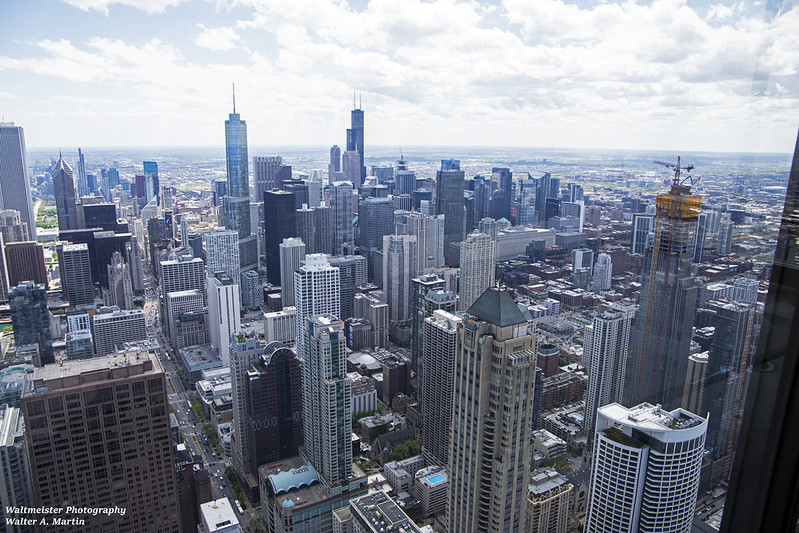

In [ ]:
chicago_image

In [ ]:
get_vector(chicago_image)

tensor([1.8430e+00, 5.6366e-01, 1.5001e+00, 4.9168e-01, 1.0023e+00, 3.3570e-02,
        9.7868e-02, 2.5127e-01, 1.0380e+00, 2.0551e+00, 1.7620e+00, 4.6961e-02,
        7.4825e-03, 3.0315e-01, 3.5842e-01, 3.1458e+00, 1.9277e-01, 2.2919e-01,
        2.2219e+00, 3.0874e+00, 1.2135e+00, 1.0717e+00, 9.4648e-01, 2.3980e+00,
        6.4238e-01, 1.3969e+00, 4.8147e-01, 1.1132e+00, 5.6093e-01, 1.1985e+00,
        6.1270e-02, 1.1408e+00, 1.0687e-01, 6.5741e-01, 9.2353e-01, 4.4482e-02,
        6.0809e-01, 2.1669e+00, 2.6067e+00, 1.0620e+00, 9.7415e-01, 0.0000e+00,
        1.3315e+00, 5.1630e-01, 2.4657e+00, 2.0228e-01, 4.2080e-01, 2.1998e+00,
        1.1540e+00, 2.1194e-01, 4.1004e-01, 6.5070e-02, 8.2438e-01, 2.3746e+00,
        1.0595e+00, 1.0759e-01, 3.6200e+00, 2.6871e-03, 1.0122e+00, 3.9475e-01,
        4.9370e-01, 3.7419e-01, 7.1920e-01, 3.6617e-01, 1.7764e-01, 6.9092e-01,
        5.2865e-02, 2.7825e-02, 2.5253e+00, 9.4637e-01, 9.8855e-02, 7.2534e-01,
        1.4122e-01, 1.3156e-01, 1.5106e+

In [ ]:
img2vec = Img2Vec()

In [ ]:
chicago_city_vec = img2vec.get_vec(chicago_image)

In [ ]:
chicago_city_vec

array([5.52366436e-01, 8.57712507e-01, 1.56175983e+00, 1.88119560e-01,
       1.58136797e+00, 1.49624392e-01, 9.75922227e-01, 4.96289432e-01,
       7.61028826e-01, 1.52906001e+00, 1.41357422e+00, 7.08835199e-02,
       4.89480764e-01, 4.99986678e-01, 2.93151975e-01, 1.44247293e+00,
       3.90512824e-01, 1.96746677e-01, 1.26352322e+00, 2.56329036e+00,
       6.92422748e-01, 9.77859497e-01, 1.68553042e+00, 2.54163027e+00,
       3.68566424e-01, 4.73247558e-01, 5.09107530e-01, 7.60494232e-01,
       8.56726587e-01, 5.71841478e-01, 1.30979240e-01, 1.26355374e+00,
       3.24237309e-02, 5.88395476e-01, 6.44626141e-01, 7.57106170e-02,
       5.73540509e-01, 1.28408647e+00, 2.53748298e+00, 5.53423822e-01,
       1.03107238e+00, 2.73958109e-02, 1.28106880e+00, 2.00771093e-01,
       2.06708503e+00, 5.44997096e-01, 1.87940955e-01, 1.25077653e+00,
       1.49745691e+00, 3.99844982e-02, 1.87599555e-01, 5.60809255e-01,
       6.56672120e-01, 1.29318345e+00, 1.16060741e-01, 4.91082110e-03,
      

In [ ]:
manhattan_path = "/content/drive/MyDrive/macss6000/week9/city_landscape/Manhattan_1195.jpg"

In [ ]:
san_path = "/content/drive/MyDrive/macss6000/week9/city_landscape/San_1921.jpg"

In [ ]:
manhattan_image = Image.open("/content/drive/MyDrive/macss6000/week9/city_landscape/Manhattan_1195.jpg")

In [ ]:
san_image = Image.open("/content/drive/MyDrive/macss6000/week9/city_landscape/San_1921.jpg")

In [ ]:
manhattan_image = Image.open(manhattan_path).convert('RGB')

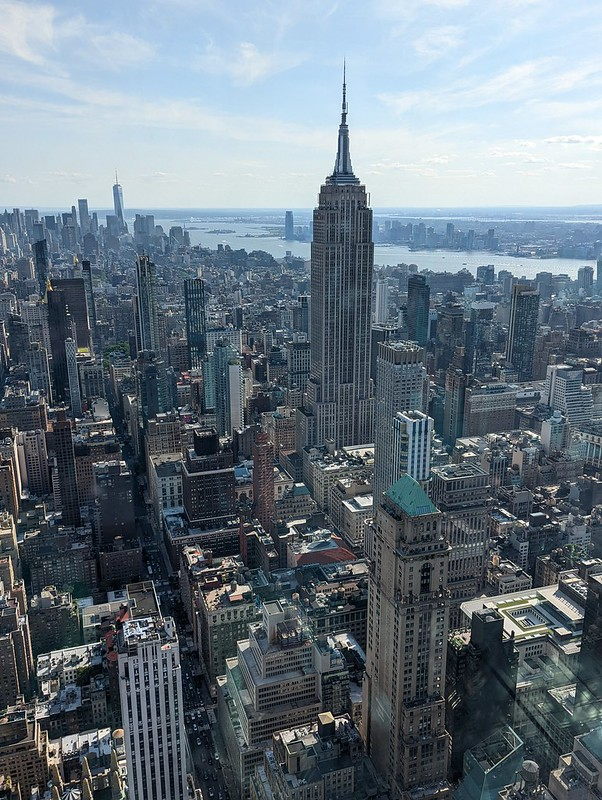

In [ ]:
manhattan_image

In [ ]:
manhattan_img = Image.open(manhattan_path).convert('RGB')
manhattan_img_t = transformations(manhattan_img)
manhattan_batch_t = torch.unsqueeze(manhattan_img_t, 0)
manhattan_prediction = model(manhattan_batch_t)

_, indices = torch.sort(manhattan_prediction, descending=True)
manhattan_percentage = torch.nn.functional.softmax(manhattan_prediction, dim=1)[0] * 100
manhattan_percentages_raw = [manhattan_percentage[x].item() for x in range(0, len(manhattan_percentage))]

manhattan_top10 = [(labels[idx], manhattan_percentage[idx].item()) for idx in indices[0][:10]]

In [ ]:
manhattan_top10

[('obelisk', 20.576526641845703),
 ('dome', 16.513391494750977),
 ('triumphal arch', 9.624526977539062),
 ('pedestal plinth footstall', 8.871706008911133),
 ('bell cote bell cot', 5.479525089263916),
 ('church church building', 5.408042907714844),
 ('monastery', 4.114314079284668),
 ('mosque', 3.489773988723755),
 ('palace', 3.3296291828155518),
 ('castle', 3.2121784687042236)]

In [ ]:
san_img = Image.open(san_path).convert('RGB')
san_img_t = transformations(san_img)
san_batch_t = torch.unsqueeze(san_img_t, 0)
san_prediction = model(san_batch_t)

_, indices = torch.sort(san_prediction, descending=True)
san_percentage = torch.nn.functional.softmax(san_prediction, dim=1)[0] * 100
san_percentages_raw = [san_percentage[x].item() for x in range(0, len(san_percentage))]

san_top10 = [(labels[idx], san_percentage[idx].item()) for idx in indices[0][:10]]

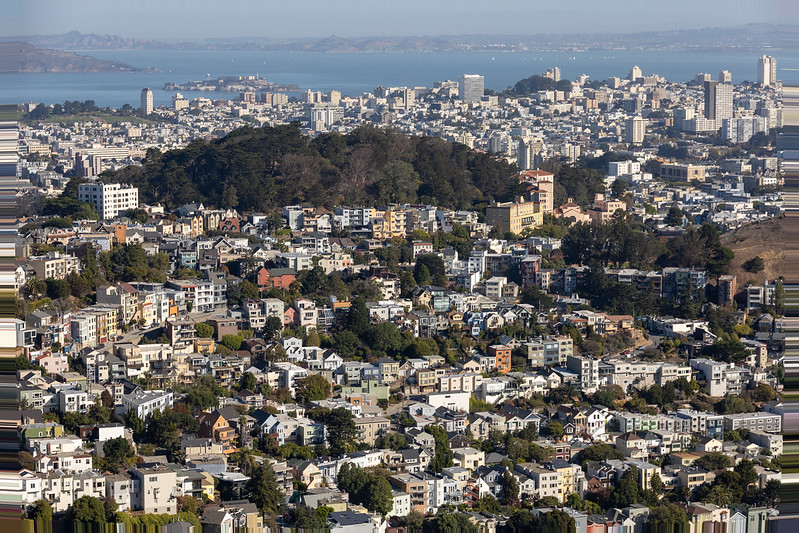

In [ ]:
san_img

In [ ]:
san_top10

[('jigsaw puzzle', 30.142160415649414),
 ('seashore coast seacoast sea-coast', 8.895279884338379),
 ('honeycomb', 8.793851852416992),
 ('alp', 6.678480625152588),
 ('stone wall', 6.58320426940918),
 ('cliff drop drop-off', 4.168433666229248),
 ('promontory headland head foreland', 3.70066237449646),
 ('lakeside lakeshore', 2.1552810668945312),
 ('apiary bee house', 1.880338430404663),
 ('valley vale', 1.755881905555725)]

In [ ]:
manhattan_vec = img2vec.get_vec(manhattan_image.convert('RGB'), tensor=True)

In [ ]:
san_vec = img2vec.get_vec(san_image.convert('RGB'), tensor=True)

In [ ]:
chicago_city_vec = img2vec.get_vec(chicago_image, tensor=True)

In [ ]:
chicago_cos = nn.CosineSimilarity(dim=1, eps=1e-6)

In [ ]:
chicago_cos_sim = chicago_cos(manhattan_vec,
              san_vec)

In [ ]:
chicago_cos_sim

tensor([[[0.7426]]])

In [ ]:
chicago_cos_sim = cos(chicago_city_vec,
              san_vec)

In [ ]:
chicago_cos_sim

tensor([[[0.7112]]])

 the Manhattan image is more similar to the San Francisco image than the Chicago image is to the San Francisco image.

 But the gap is very narrow.

In [ ]:
directory_path = "/content/drive/MyDrive/macss6000/week9/Flickr_imagesave"

In [ ]:
def load_and_predict_images(directory_path):
    images_predictions = []
    for filename in os.listdir(directory_path):
        if filename.endswith(".jpg"):  # Adjust this condition based on your file types
            img_path = os.path.join(directory_path, filename)
            try:
                img = Image.open(img_path).convert('RGB')
                img_t = transformations(img)
                img_batch_t = torch.unsqueeze(img_t, 0)

                prediction = model(img_batch_t)
                _, indices = torch.sort(prediction, descending=True)
                percentage = torch.nn.functional.softmax(prediction, dim=1)[0] * 100
                top10 = [(labels[idx], percentage[idx].item()) for idx in indices[0][:10]]

                images_predictions.append((filename, top10))
            except Exception as e:
                print(f"Error processing {filename}: {e}")
    return images_predictions

In [ ]:
images_predictions = load_and_predict_images(directory_path)

In [ ]:
# Output the results
for filename, predictions in images_predictions:
    print(f"Top 10 Predictions for {filename}:")
    for label, percentage in predictions:
        print(f"{label}: {percentage:.2f}%")
    print("\n")

Streaming output truncated to the last 5000 lines.
stone wall: 2.74%
cardoon: 2.64%
mushroom: 2.49%
acorn: 2.04%
hen-of-the-woods hen of the woods Polyporus frondosus Grifola frondosa: 1.95%
volcano: 1.75%


Top 10 Predictions for Chicao_8083.jpg:
pot flowerpot: 22.99%
goldfish Carassius auratus: 14.33%
hip rose hip rosehip: 10.71%
volcano: 7.66%
admiral: 2.76%
stinkhorn carrion fungus: 2.53%
orange: 2.27%
starfish sea star: 1.45%
jack-o'-lantern: 1.23%
black widow Latrodectus mactans: 1.11%


Top 10 Predictions for Chicao_8077.jpg:
crutch: 17.81%
swing: 11.28%
unicycle monocycle: 10.31%
punching bag punch bag punching ball punchball: 9.76%
basketball: 7.22%
parallel bars bars: 4.84%
pole: 3.68%
miniskirt mini: 2.83%
horizontal bar high bar: 2.45%
barbell: 2.30%


Top 10 Predictions for Chicao_8076.jpg:
sliding door: 18.41%
prison prison house: 10.43%
parking meter: 9.18%
turnstile: 7.68%
shoji: 4.09%
scale weighing machine: 3.90%
pay-phone pay-station: 3.48%
washer automatic washer wa

In [ ]:
def load_and_predict_images(directory_path):
    data = []  # To store information in a structured way for DataFrame creation
    for filename in os.listdir(directory_path):
        if filename.endswith(".jpg"):  # Adjust this condition based on your file types
            img_path = os.path.join(directory_path, filename)
            try:
                img = Image.open(img_path).convert('RGB')
                img_t = transformations(img)
                img_batch_t = torch.unsqueeze(img_t, 0)

                prediction = model(img_batch_t)
                _, indices = torch.sort(prediction, descending=True)
                percentage = torch.nn.functional.softmax(prediction, dim=1)[0] * 100
                top10 = [(labels[idx], percentage[idx].item()) for idx in indices[0][:10]]

                for label, percent in top10:
                    data.append({'Filename': filename, 'Label': label, 'Percentage': percent})
            except Exception as e:
                print(f"Error processing {filename}: {e}")

    return pd.DataFrame(data)

# Load and predict
df_top = load_and_predict_images(directory_path)

# Display the DataFrame
print(df_top.head())

KeyboardInterrupt: 

In [ ]:
df_top.head

,Filename,Label,Percentage
0,Chicago_100.jpg,greenhouse nursery glasshouse,35.784386
1,Chicago_100.jpg,mobile home manufactured home,27.754381
2,Chicago_100.jpg,patio terrace,13.930568
3,Chicago_100.jpg,boathouse,5.669504
4,Chicago_100.jpg,lakeside lakeshore,3.362275
...,...,...,...
84945,Chicao_8446.jpg,castle,3.479651
84946,Chicao_8446.jpg,fountain,2.459494
84947,Chicao_8446.jpg,dome,2.067106
84948,Chicao_8446.jpg,pier,1.632925


In [ ]:
df_top.head

<bound method NDFrame.head of               Filename                                              Label  \
0      Chicago_100.jpg                      greenhouse nursery glasshouse   
1      Chicago_100.jpg                      mobile home manufactured home   
2      Chicago_100.jpg                                      patio terrace   
3      Chicago_100.jpg                                          boathouse   
4      Chicago_100.jpg                                 lakeside lakeshore   
...                ...                                                ...   
84945  Chicao_8446.jpg                                             castle   
84946  Chicao_8446.jpg                                           fountain   
84947  Chicao_8446.jpg                                               dome   
84948  Chicao_8446.jpg                                               pier   
84949  Chicao_8446.jpg  cinema movie theater movie theatre movie house...   

       Percentage  
0       35.784386  
1       27.754381  
2       13.930568  
3        5.669504  
4        3.362275  
...           ...  
84945    3.479651  
84946    2.459494  
84947    2.067106  
84948    1.632925  
84949    1.566782  

[84950 rows x 3 columns]>

In [ ]:
def load_and_predict_images(directory_path):
    all_labels = []  # Used to collect labels from all images

    for filename in os.listdir(directory_path):
        if filename.endswith(".jpg"):
            img_path = os.path.join(directory_path, filename)
            try:
                img = Image.open(img_path).convert('RGB')
                img_t = transformations(img)
                img_batch_t = torch.unsqueeze(img_t, 0)

                prediction = model(img_batch_t)
                _, indices = torch.sort(prediction, descending=True)
                percentage = torch.nn.functional.softmax(prediction, dim=1)[0] * 100
                top10 = [(labels[idx], percentage[idx].item()) for idx in indices[0][:10]]

                for label, _ in top10:
                    all_labels.append(label)
            except Exception as e:
                print(f"Error processing {filename}: {e}")

    return all_labels

In [ ]:
from collections import Counter

In [ ]:
# Load and predict
all_labels = load_and_predict_images(directory_path)

# Count the frequency of occurrence of each element
label_counts = Counter(all_labels)

# common 100 feature
most_common_100 = label_counts.most_common(100)

# DataFrame
df_most_common = pd.DataFrame(most_common_100, columns=['Label', 'Frequency'])

In [ ]:
# print DataFrame
df_most_common[:20]

,Label,Frequency
0,pier,1451
1,bell cote bell cot,1361
2,palace,1303
3,prison prison house,1184
4,cinema movie theater movie theatre movie house...,1170
5,church church building,1119
6,dome,1100
7,library,990
8,cab hack taxi taxicab,989
9,volleyball,904


In [ ]:
df_most_common1 = df_most_common[:20]

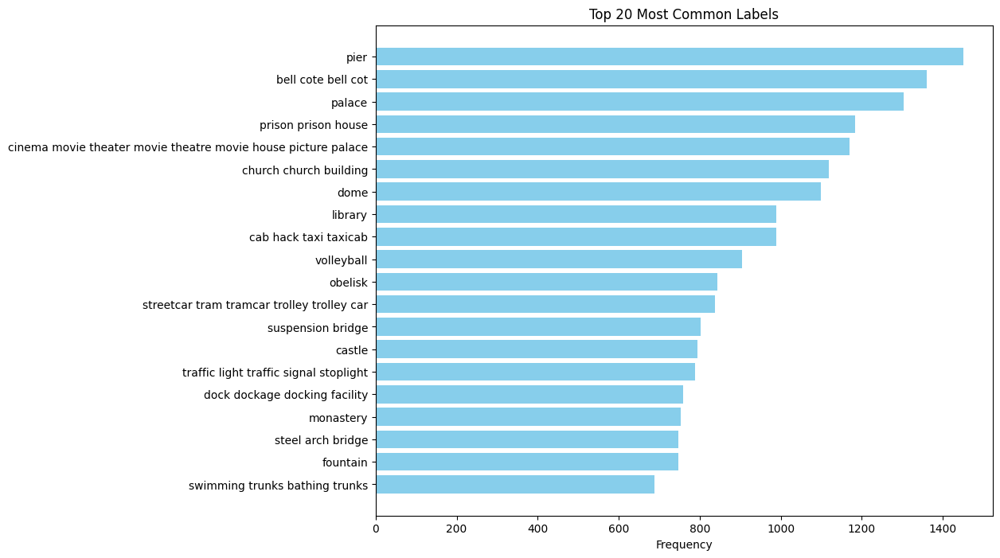

In [ ]:
plt.figure(figsize=(10, 8))
plt.barh(df_most_common1['Label'], df_most_common1['Frequency'], color='skyblue')
plt.xlabel('Frequency')
plt.title('Top 20 Most Common Labels')
plt.gca().invert_yaxis()  # Invert y-axis to have the highest frequency on top
plt.show()

In [ ]:
df_most_common[:30]

,Label,Frequency
0,pier,1451
1,bell cote bell cot,1361
2,palace,1303
3,prison prison house,1184
4,cinema movie theater movie theatre movie house...,1170
5,church church building,1119
6,dome,1100
7,library,990
8,cab hack taxi taxicab,989
9,volleyball,904


In [ ]:
df_last = df_most_common[-20:]

In [ ]:
df_last

,Label,Frequency
80,cash machine cash dispenser automated teller m...,283
81,sarong,283
82,fireboat,278
83,basketball,276
84,grocery store grocery food market market,271
85,submarine pigboat sub U-boat,266
86,bee,261
87,analog clock,256
88,beacon lighthouse beacon light pharos,250
89,pay-phone pay-station,247


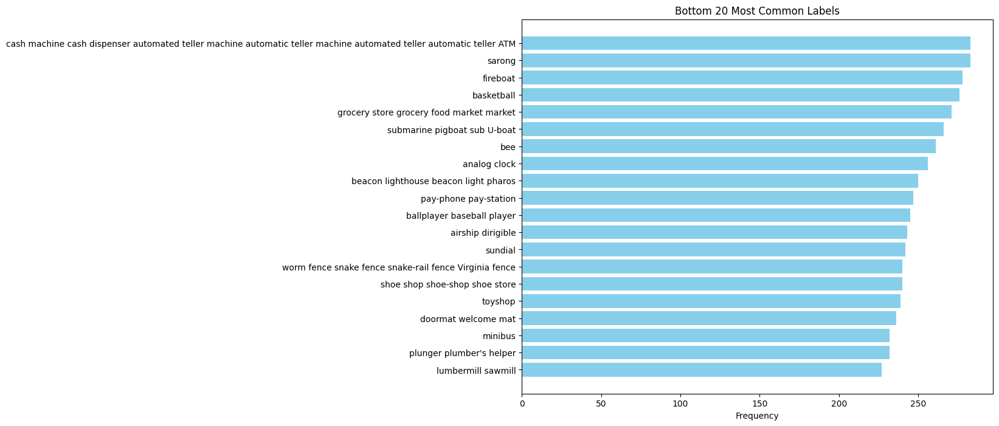

In [ ]:
plt.figure(figsize=(10, 8))
plt.barh(df_last['Label'], df_last['Frequency'], color='skyblue')
plt.xlabel('Frequency')
plt.title('Bottom 20 Most Common Labels')
plt.gca().invert_yaxis()  # Invert y-axis to have the highest frequency on top
plt.show()

directory_path = "/content/drive/MyDrive/macss6000/week9/San"

In [ ]:
san_directory_path = "/content/drive/MyDrive/macss6000/week9/San"

In [ ]:
# Load and predict
san_all_labels = load_and_predict_images(san_directory_path)

# Count the frequency of occurrence of each element
san_label_counts = Counter(san_all_labels)

# common 20 feature
san_most_common_20 = san_label_counts.most_common(20)

# DataFrame
san_df_most_common = pd.DataFrame(san_most_common_20, columns=['Label', 'Frequency'])

In [ ]:
san_df_most_common

,Label,Frequency
0,streetcar tram tramcar trolley trolley car,1731
1,trolleybus trolley coach trackless trolley,1711
2,minibus,1656
3,passenger car coach carriage,1514
4,recreational vehicle RV R.V.,1322
5,school bus,1202
6,ambulance,1001
7,police van police wagon paddy wagon patrol wag...,997
8,lakeside lakeshore,890
9,pier,889


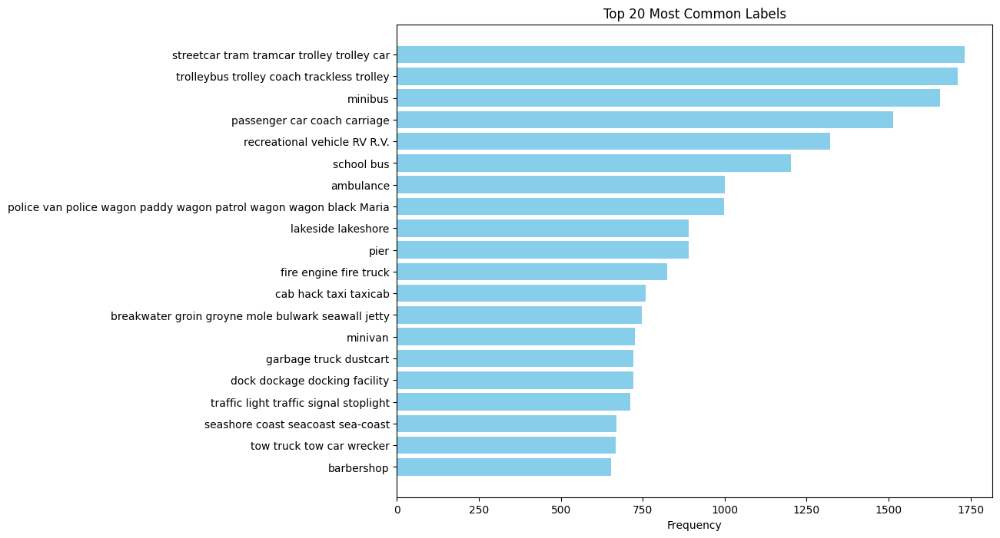

In [ ]:
plt.figure(figsize=(10, 8))
plt.barh(san_df_most_common['Label'], san_df_most_common['Frequency'], color='skyblue')
plt.xlabel('Frequency')
plt.title('Top 20 Most Common Labels')
plt.gca().invert_yaxis()  # Invert y-axis to have the highest frequency on top
plt.show()

In [ ]:
man_directory_path = "/content/drive/MyDrive/macss6000/week9/Manhattan"

In [ ]:
# Load and predict
man_all_labels = load_and_predict_images(man_directory_path)

# Count the frequency of occurrence of each element
man_label_counts = Counter(man_all_labels)

# common 20 feature
man_most_common_20 = man_label_counts.most_common(20)

# DataFrame
man_df_most_common = pd.DataFrame(man_most_common_20, columns=['Label', 'Frequency'])

In [ ]:
man_df_most_common

,Label,Frequency
0,pier,1071
1,palace,937
2,bell cote bell cot,927
3,church church building,858
4,lakeside lakeshore,785
5,cinema movie theater movie theatre movie house...,784
6,fountain,758
7,cab hack taxi taxicab,739
8,dome,735
9,obelisk,725


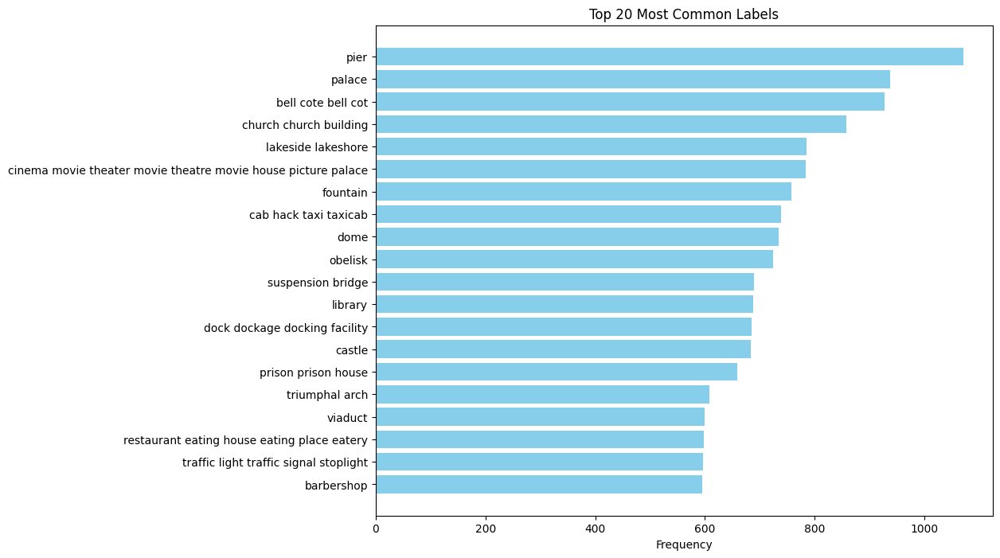

In [ ]:
plt.figure(figsize=(10, 8))
plt.barh(man_df_most_common['Label'], man_df_most_common['Frequency'], color='skyblue')
plt.xlabel('Frequency')
plt.title('Top 20 Most Common Labels')
plt.gca().invert_yaxis()  # Invert y-axis to have the highest frequency on top
plt.show()

In [7]:
man_location_directory_path = "/content/drive/MyDrive/macss6000/week9/Flickr_Manhattan.csv"

In [3]:
san_location_directory_path = "/content/drive/MyDrive/macss6000/week9/Flickr_San.csv"

In [ ]:
chicago_location_directory_path = "/content/drive/MyDrive/macss6000/week9/Flickr_Chicago.csv"

In [4]:
import matplotlib.pyplot as plt
import pandas as pd

In [8]:
df_man = pd.read_csv(man_location_directory_path)

In [5]:
df_san = pd.read_csv(san_location_directory_path)

In [ ]:
df_chicago = pd.read_csv(chicago_location_directory_path)

In [ ]:
df_chicago

,count_ID,id,url,Lat,Lng,date,tag
0,0,53394149451,https://live.staticflickr.com/65535/5339414945...,41.866519,-87.737948,2022-10-16 14:32:08,chicago illinois unitedstates
1,1,53384191989,https://live.staticflickr.com/65535/5338419198...,41.892830,-87.609881,2022-10-14 15:20:02,chicago illinois unitedstates cta1978 cta
2,2,53383042264,https://live.staticflickr.com/65535/5338304226...,41.856063,-87.646531,2022-09-23 10:35:06,chicago city urban illinois street building
3,3,53357730720,https://live.staticflickr.com/65535/5335773072...,41.890183,-87.624413,2022-10-05 15:27:48,billygoattavern chicago getolympus lensbaby le...
4,4,53352978169,https://live.staticflickr.com/65535/5335297816...,41.886211,-87.716825,2022-03-10 15:25:30,chicago garfieldparkconservatory nature flora ...
...,...,...,...,...,...,...,...
4245,4245,52250830297,https://live.staticflickr.com/65535/5225083029...,41.983638,-87.657706,2022-07-30 11:14:06,photowalk shotoniphone proraw pixelmator pixel...
4246,4246,52252085429,https://live.staticflickr.com/65535/5225208542...,41.964541,-87.657923,2022-07-29 20:24:20,photowalk shotoniphone proraw pixelmator pixel...
4247,4247,52252083669,https://live.staticflickr.com/65535/5225208366...,41.918947,-87.648581,2022-07-28 21:02:47,photowalk shotoniphone proraw pixelmator pixel...
4248,4248,52250085976,https://live.staticflickr.com/65535/5225008597...,41.899158,-87.623056,2022-07-29 09:49:04,chicago jphnhancockcenter


In [ ]:
df_chicago['date'] = pd.to_datetime(df_chicago['date'])

In [ ]:
df_chicago['date'].dtype

dtype('<M8[ns]')

In [9]:
df_man['date'] = pd.to_datetime(df_man['date'])
df_san['date'] = pd.to_datetime(df_san['date'])

In [10]:
date_counts_san = df_san['date'].dt.date.value_counts().sort_index()

In [ ]:
date_counts_mab = df_man['date'].dt.date.value_counts().sort_index()

In [ ]:
# Group the data by date and count the number of entries for each date
date_counts_chicago = df_chicago['date'].dt.date.value_counts().sort_index()

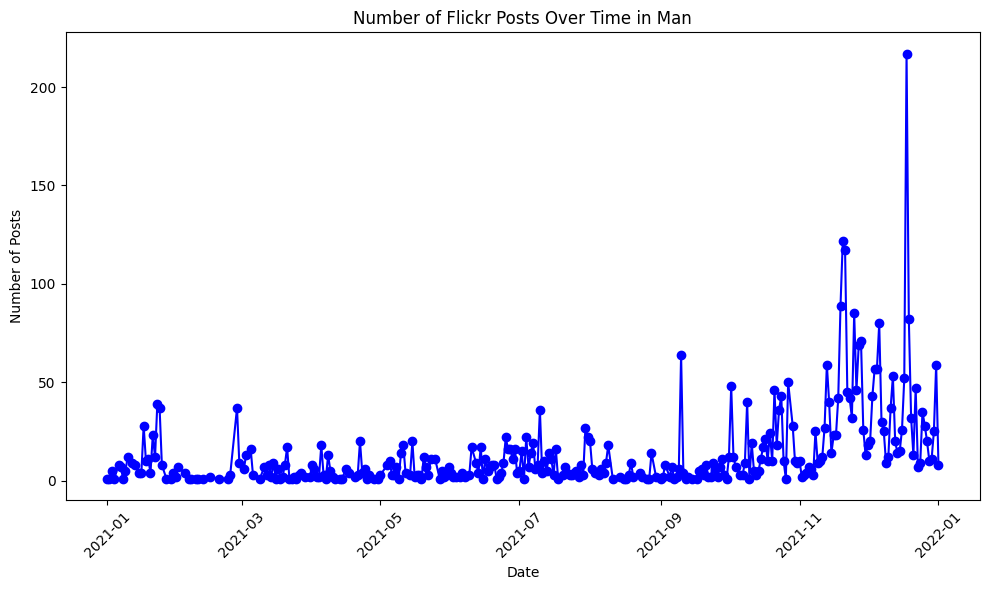

In [ ]:
# Plotting
plt.figure(figsize=(10, 6))
plt.plot(date_counts_mab.index, date_counts_mab.values, marker='o', linestyle='-', color='b')
plt.title('Number of Flickr Posts Over Time in Man')
plt.xlabel('Date')
plt.ylabel('Number of Posts')
plt.xticks(rotation=45)
plt.tight_layout()

plt.show()

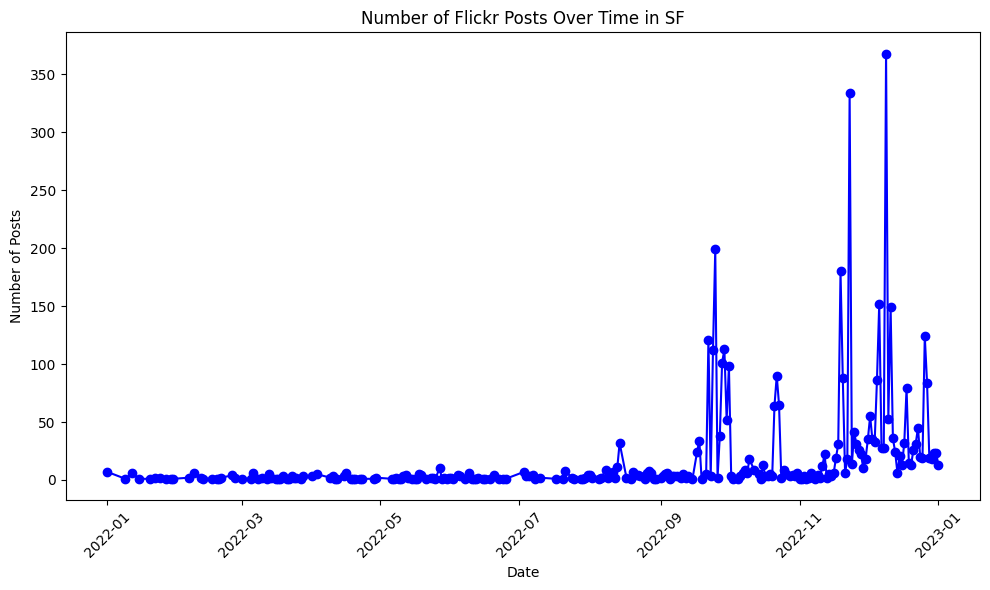

In [11]:
# Plotting
plt.figure(figsize=(10, 6))
plt.plot(date_counts_san.index, date_counts_san.values, marker='o', linestyle='-', color='b')
plt.title('Number of Flickr Posts Over Time in SF')
plt.xlabel('Date')
plt.ylabel('Number of Posts')
plt.xticks(rotation=45)
plt.tight_layout()

plt.show()

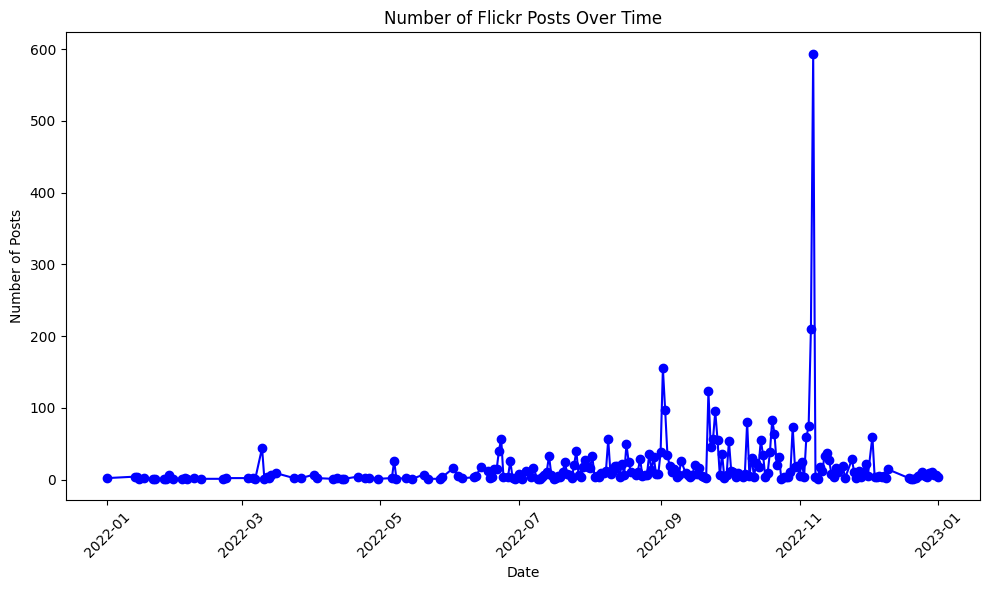

In [ ]:
# Plotting
plt.figure(figsize=(10, 6))
plt.plot(date_counts_chicago.index, date_counts_chicago.values, marker='o', linestyle='-', color='b')
plt.title('Number of Flickr Posts Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Posts')
plt.xticks(rotation=45)
plt.tight_layout()

plt.show()

In [ ]:
hourly_counts_chicago = df_chicago['date'].dt.hour.value_counts().sort_index()

In [12]:
hourly_counts_man = df_man['date'].dt.hour.value_counts().sort_index()
hourly_counts_san = df_san['date'].dt.hour.value_counts().sort_index()

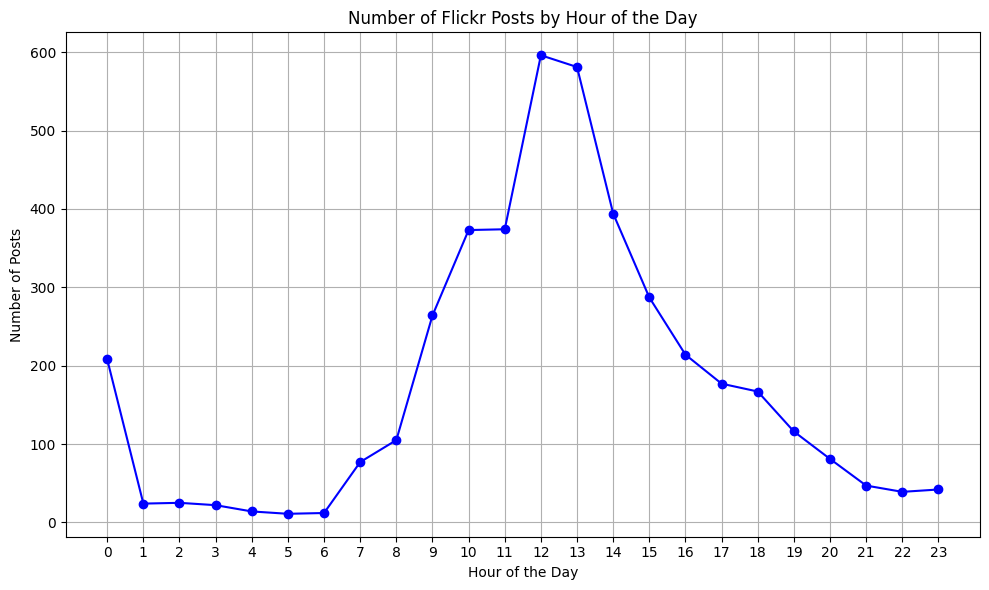

In [ ]:
# Plotting
plt.figure(figsize=(10, 6))
plt.plot(hourly_counts_chicago.index, hourly_counts_chicago.values, marker='o', linestyle='-', color='b')
plt.title('Number of Flickr Posts by Hour of the Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Posts')
plt.xticks(range(0, 24))
plt.grid(True)
plt.tight_layout()

plt.show()

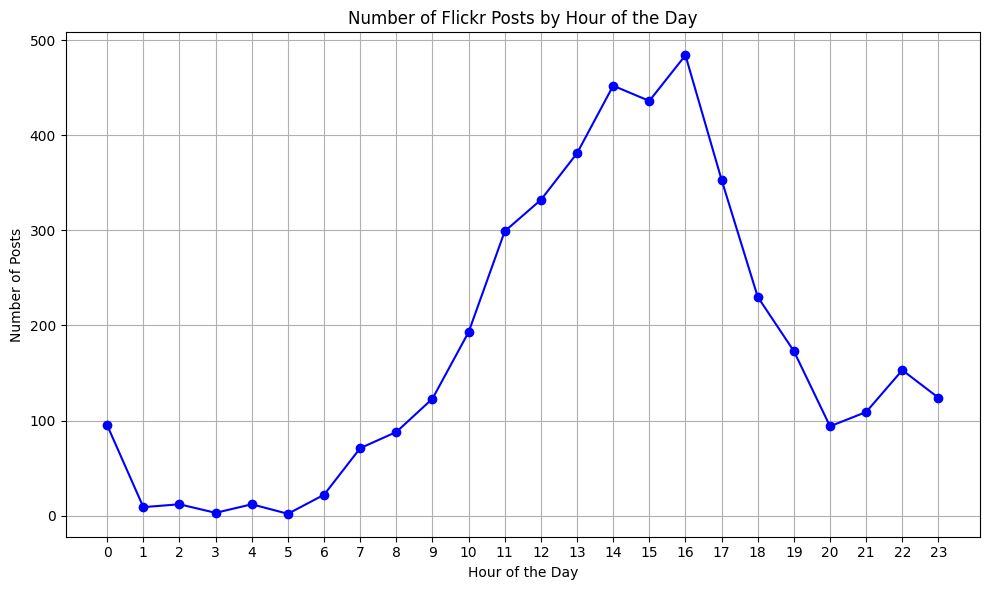

In [ ]:
# Plotting
plt.figure(figsize=(10, 6))
plt.plot(hourly_counts_man.index, hourly_counts_man.values, marker='o', linestyle='-', color='b')
plt.title('Number of Flickr Posts by Hour of the Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Posts')
plt.xticks(range(0, 24))
plt.grid(True)
plt.tight_layout()

plt.show()

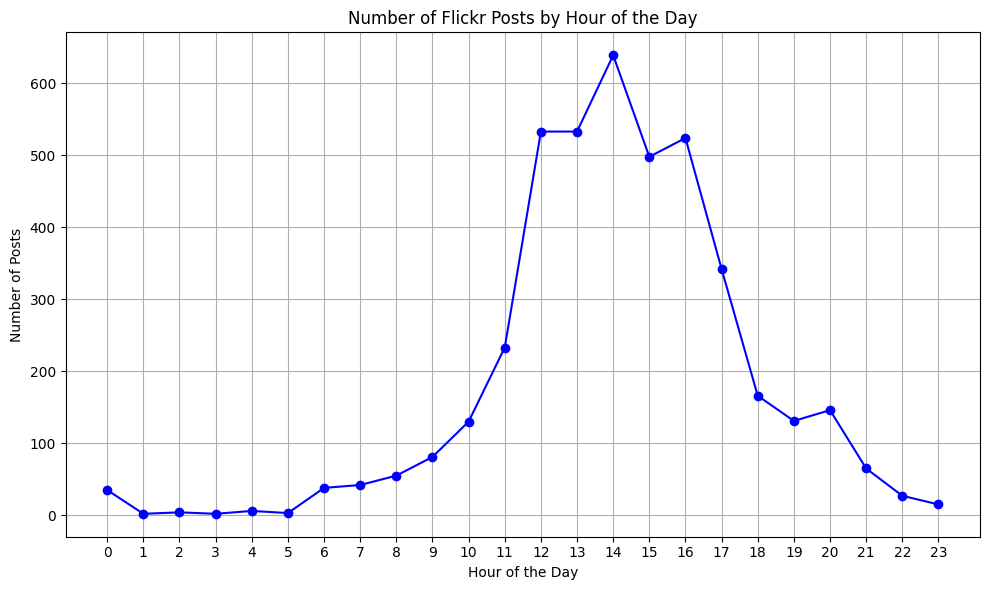

In [13]:
# Plotting
plt.figure(figsize=(10, 6))
plt.plot(hourly_counts_san.index, hourly_counts_san.values, marker='o', linestyle='-', color='b')
plt.title('Number of Flickr Posts by Hour of the Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Posts')
plt.xticks(range(0, 24))
plt.grid(True)
plt.tight_layout()

plt.show()

In [ ]:
from shapely.geometry import Point

In [ ]:
!pip install geopandas

In [ ]:
import geopandas as gpd

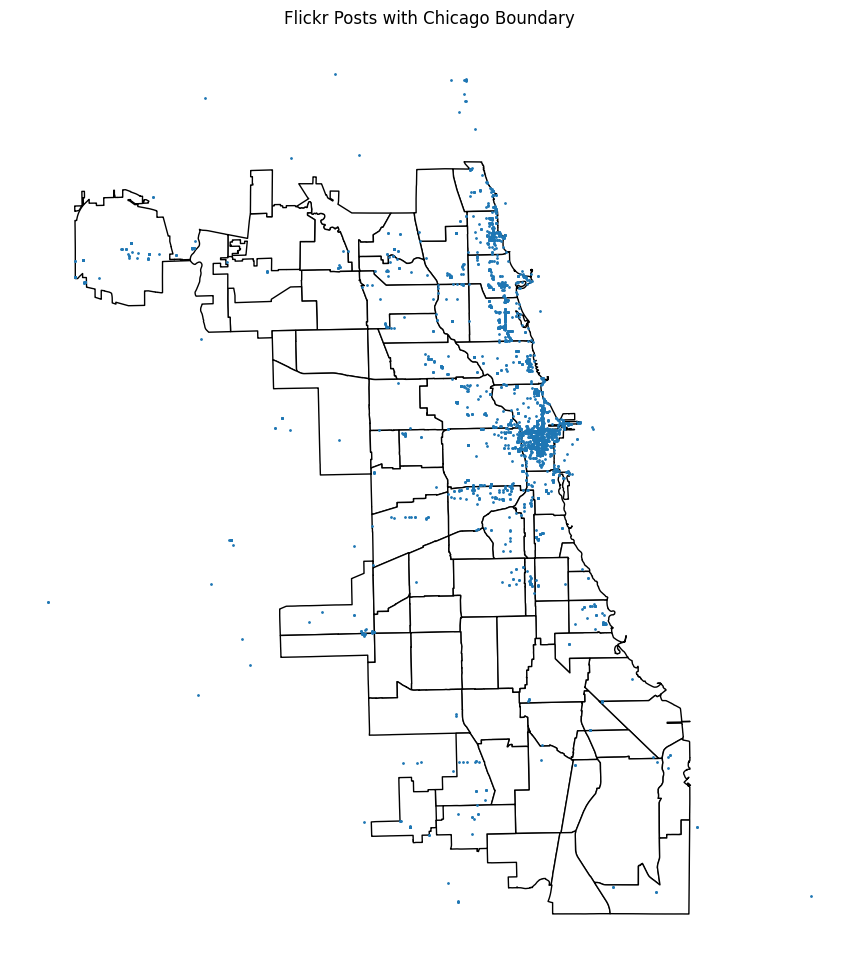

In [ ]:
# Convert the lat and lng to a shapely Point() object
df_chicago['geometry'] = df_chicago.apply(lambda row: Point(row['Lng'], row['Lat']), axis=1)

# Create a GeoDataFrame from the DataFrame
gdf_chicago = gpd.GeoDataFrame(df_chicago, geometry='geometry')

# Set the coordinate reference system (CRS) to WGS84 (epsg:4326)
gdf_chicago.crs = {'init' :'epsg:4326'}

# Load Chicago boundary data
chicago_boundary = gpd.read_file('http://data.cityofchicago.org/resource/igwz-8jzy.geojson')

# Plotting the data with the city boundary
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

# Plot the boundary
chicago_boundary.plot(ax=ax, color='white', edgecolor='black')

# Plot the Flickr posts
gdf_chicago.plot(ax=ax, markersize=1)

# Set the title and axes labels
plt.title('Flickr Posts with Chicago Boundary')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Remove the axis for a cleaner look
plt.axis('off')

# Show the plot
plt.show()

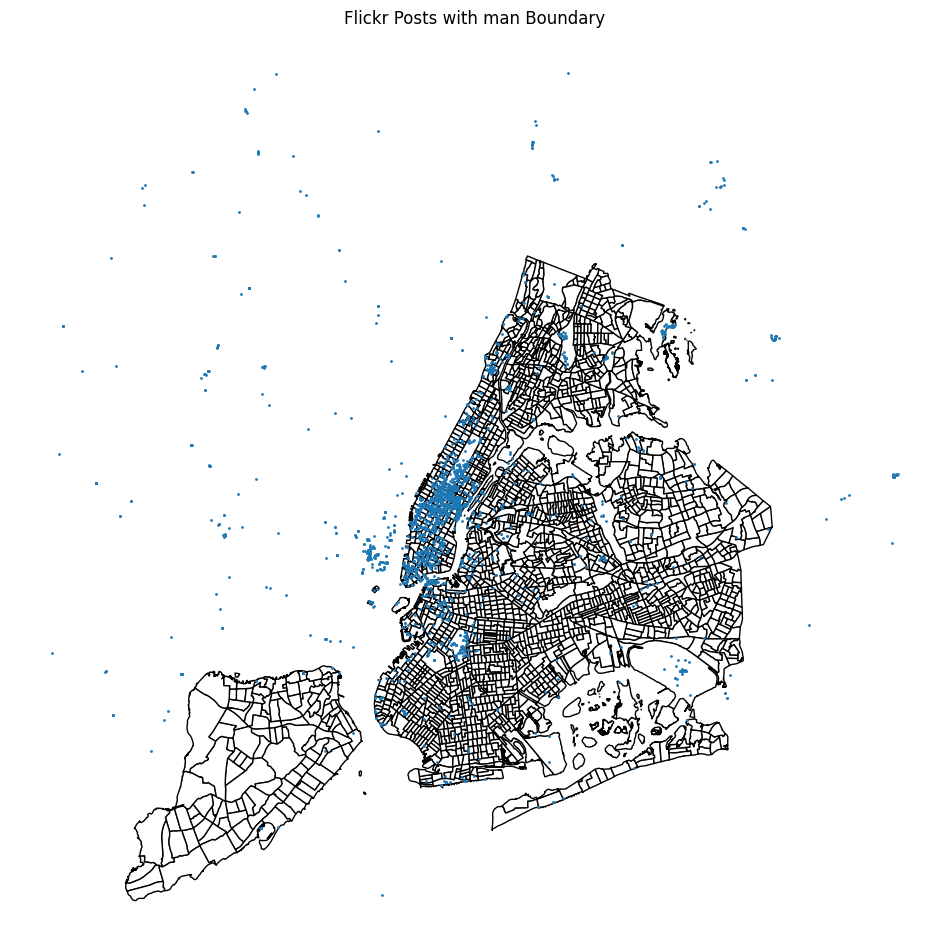

In [ ]:
# Convert the lat and lng to a shapely Point() object
df_man['geometry'] = df_man.apply(lambda row: Point(row['Lng'], row['Lat']), axis=1)

# Create a GeoDataFrame from the DataFrame
gdf_man = gpd.GeoDataFrame(df_man, geometry='geometry')

# Set the coordinate reference system (CRS) to WGS84 (epsg:4326)
gdf_man.crs = {'init' :'epsg:4326'}

# Load Chicago boundary data
man_boundary = gpd.read_file('https://services5.arcgis.com/GfwWNkhOj9bNBqoJ/arcgis/rest/services/NYC_Census_Tracts_for_2020_US_Census/FeatureServer/0/query?where=1=1&outFields=*&outSR=4326&f=pgeojson')

# Plotting the data with the city boundary
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

# Plot the boundary
man_boundary.plot(ax=ax, color='white', edgecolor='black')

# Plot the Flickr posts
gdf_man.plot(ax=ax, markersize=1)

# Set the title and axes labels
plt.title('Flickr Posts with man Boundary')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Remove the axis for a cleaner look
plt.axis('off')

# Show the plot
plt.show()

/usr/local/lib/python3.10/dist-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


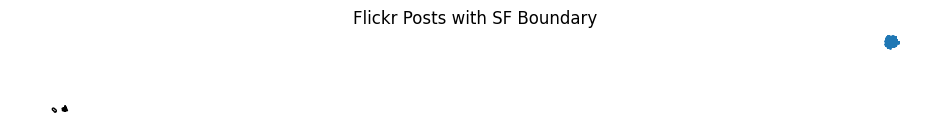

In [ ]:
# Convert the lat and lng to a shapely Point() object
df_san['geometry'] = df_san.apply(lambda row: Point(row['Lng'], row['Lat']), axis=1)

# Create a GeoDataFrame from the DataFrame
gdf_san = gpd.GeoDataFrame(df_san, geometry='geometry')

# Set the coordinate reference system (CRS) to WGS84 (epsg:4326)
gdf_san.crs = {'init' :'epsg:4326'}

# Load Chicago boundary data
san_boundary = gpd.read_file('https://data.sfgov.org/resource/tmph-tgz9.geojson')



# Plotting the data with the city boundary
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

# Plot the boundary
san_boundary.plot(ax=ax, color='white', edgecolor='black')

# Plot the Flickr posts
gdf_san.plot(ax=ax, markersize=1)

# Set the title and axes labels
plt.title('Flickr Posts with SF Boundary')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Remove the axis for a cleaner look
plt.axis('off')

# Show the plot
plt.show()

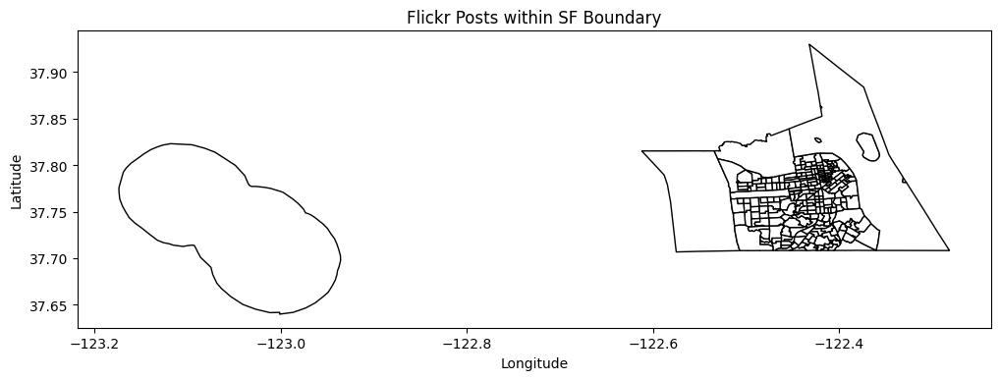

In [ ]:
# Convert the lat and lng to a shapely Point() object
df_san['geometry'] = df_san.apply(lambda row: Point(row['Lng'], row['Lat']), axis=1)

# Create a GeoDataFrame from the DataFrame
gdf_san = gpd.GeoDataFrame(df_san, geometry='geometry')

# Set the coordinate reference system (CRS) to WGS84
gdf_san.set_crs(epsg=4326, inplace=True)

# Load San Francisco boundary data from a GeoJSON file
san_boundary = gpd.read_file('https://data.sfgov.org/resource/tmph-tgz9.geojson')
san_boundary.set_crs(epsg=4326, inplace=True)

# Filter the Flickr posts to include only those within the San Francisco boundary
gdf_san_in_sf = gdf_san[gdf_san.geometry.within(san_boundary.unary_union)]

# Plotting the data with the city boundary
fig, ax = plt.subplots(1, 1, figsize=(12, 12))
san_boundary.plot(ax=ax, color='white', edgecolor='black')
plt.title('Flickr Posts within SF Boundary')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Set the aspect of the plot to be equal, to avoid distortion of the data
ax.set_aspect('equal')

plt.show()

/usr/local/lib/python3.10/dist-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


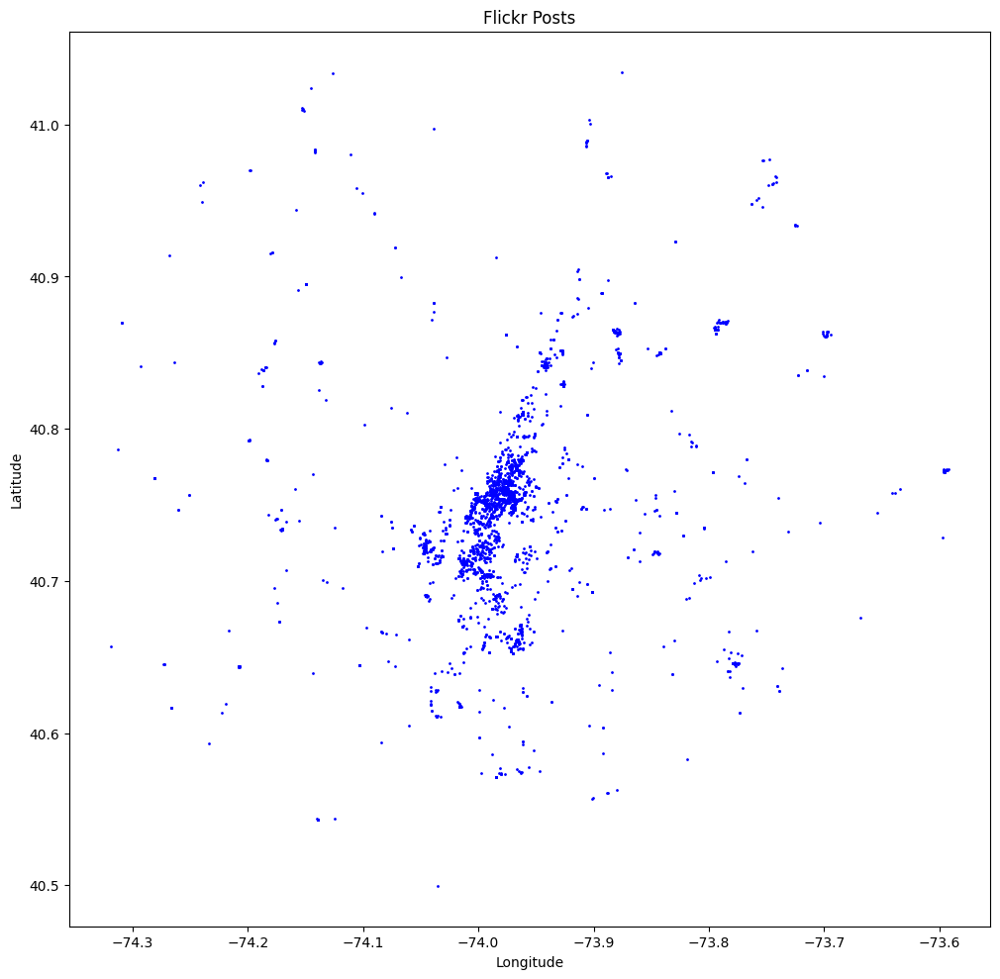

In [ ]:
# Convert the lat and lng to a shapely Point() object
df_san['geometry'] = df_san.apply(lambda row: Point(row['Lng'], row['Lat']), axis=1)

# Create a GeoDataFrame from the DataFrame
gdf_san = gpd.GeoDataFrame(df_san, geometry='geometry')

# Set the coordinate reference system (CRS) to WGS84 (epsg:4326)
gdf_san.crs = {'init' :'epsg:4326'}

# Plotting the data
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

# Plot the Flickr posts
gdf_san.plot(ax=ax, markersize=1, color='blue')

# Set the title and axes labels
plt.title('Flickr Posts')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Show the plot
plt.show()

# Optional: Do androids dream of electric sheep?
If text and images can both be turned into vectors, why not transform one into the other? We can turn images to text with classification (e.g., ImageNet) or captioning, and we can turn text to images. If you're using the the ChatGPT with the web interface, you've probably had a try on prompting ChatGPT to generate images(If not, try it now!) via it's image engine DALL·E.

Rome was not built in one day. OpenAI's DALL·E was based on their previous transformer-based model [CLIP](https://openai.com/blog/clip/).
Here are a few images generated with [Deep Daze](https://github.com/lucidrains/deep-daze), which uses CLIP. You can see how the technology evolves.

<img src="https://github.com/lucidrains/deep-daze/raw/main/samples/Mist_over_green_hills.jpg" width="256px"></img>

<center>*mist over green hills*</center>

<img src="https://github.com/lucidrains/deep-daze/raw/main/samples/Life_during_the_plague.jpg" width="256px"></img>

<center>*life during the plague*</center>

<img src="https://github.com/lucidrains/deep-daze/raw/main/samples/A_man_painting_a_completely_red_image.png" width="256px"></img>

<center>*a man painting a completely red image*</center>

With a decent GPU, you can make these images yourself! Wouldn't this make a cool title slide for your final project presentation?

The Deep Daze model can be ran by installing a `pip` package and running on the command prompt.

```
!pip install deep-daze
!imagine "a robotic aristocrat, in the style of Rembrandt"
```

Another branch of techonogly that DALL·E relies on is diffusion models, which process starts with noise and gradually refines it into a coherent image that matches the description provided. Here, I recommend instead using one of the Colab notebooks with diffusion models, which are newer, faster, and produce (in my opinion) cooler output. A great one is [Disco Diffusion](https://colab.research.google.com/github/alembics/disco-diffusion/blob/main/Disco_Diffusion.ipynb), based on [Guided Diffusion](https://github.com/openai/guided-diffusion) made by... big surprise.... OpenAI! To use that notebook (as of March 2022):

1. Click `Copy to Drive` and switch to your new copy.
2. Scroll down and change the `text_prompt[0]` from "A beautiful painting..." to something related to your final project.
3. Click `Runtime -> Change runtime type` and select `GPU`. Note that Colab Pro might give you a better GPU.
4. Click `Runtime -> Run all`.

The rest of the notebook are just a huge range of settings you can play with for desired output. You can decrease or increase the number of iterations or epochs for faster test runs or a high-quality final product. Keep in mind that creating a video rather than images requires a lot more computation.

There is another similar notebook [v-diffusion-pytorch](https://colab.research.google.com/drive/1M4QKDt5ExIo3GLml0YKcJM9gfaX9ptfg) that you can experiment with. (From my experimentation, V Diffusion seems to be the fastest, and ithe quality is better than Deep Daze but not as good as Disco Diffusion.)

Remember that many AI tools start out looking like parlor tricks before we're able to scale them up and find practical applications, and this field is progressing at a breakneck rate. We're only at [the beginning of the future](https://80000hours.org/articles/future-generations/)! (Ofc OpenAI has released the amazing Sora video generation model, which seems to be the begining) The model has not been officially released yet, you're also encouraged to read the [technical report](https://openai.com/sora) or @ Sam Altman on X to let him generate some Sora videos for you :)


## <font color="red">*Stretch (not required)*</font>

<font color="red">Take a look at those models and try to generate images using differnet models (DALL·E, CLIP, Diffusion models, etc.) and show how the models made progress on image generation (e.g., how to acurately generate fingers)